<center><image src="https://drive.google.com/uc?id=1n3G4TdK_u6PQHcLrxB_A0HijNdigXmUH">

<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Сегментация изображений</b></h3>


В этом задании вам предстоит решить задачу сегментации медицинских снимков. Домашнее задание можно разделить на следующие части:

* Построй свой первый бейзлайн! [6]
  * BCE Loss [2]
  * SegNet [2]
  * Train [1]
  * Test [1]
* Мир других лоссов! [2]
  * Dice Loss [1]
  * Focal Loss [1]
  * BONUS: лосс из статьи [5]
* Новая модель! [2]
  * UNet [2]


**Максимальный балл:** 10 баллов.

Также для студентов желающих еще более углубиться в задачу предлагается решить бонусное задание, которое даст дополнительные 5 баллов. BONUS задание необязательное.


# Загрузка данных

1. Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>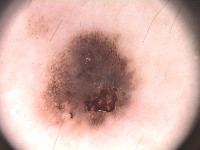</td><td>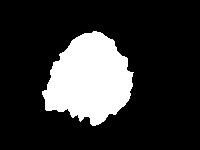</td></tr></table>

2. Разархивируем .rar файл.
3. Обратите внимание, что папка  `PH2 Dataset images` должна лежать там же где и ipynb notebook.

Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном задании мы не будем заниматься их классификацией, а будем **сегментировать** их.

In [ ]:
!gdown 1T_RPkPP0jeWwK8L1UrmBw8V30eD7v6Ql

Failed to retrieve file url:

	Too many users have viewed or downloaded this file recently. Please
	try accessing the file again later. If the file you are trying to
	access is particularly large or is shared with many people, it may
	take up to 24 hours to be able to view or download the file. If you
	still can't access a file after 24 hours, contact your domain
	administrator.

You may still be able to access the file from the browser:

	https://drive.google.com/uc?id=1T_RPkPP0jeWwK8L1UrmBw8V30eD7v6Ql

but Gdown can't. Please check connections and permissions.


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
get_ipython().system_raw("unrar x PH2Dataset.rar")

Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

Для загрузки датасета можно использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [4]:
import os

In [5]:
!pip install unrar
!unrar x '/content/drive/MyDrive/PH2Dataset.rar'


UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/drive/MyDrive/PH2Dataset.rar

Creating    PH2Dataset                                                OK
Creating    PH2Dataset/PH2 Dataset images                             OK
Creating    PH2Dataset/PH2 Dataset images/IMD002                      OK
Creating    PH2Dataset/PH2 Dataset images/IMD002/IMD002_Dermoscopic_Image  OK
Extracting  PH2Dataset/PH2 Dataset images/IMD002/IMD002_Dermoscopic_Image/IMD002.bmp       0%  OK 
Creating    PH2Dataset/PH2 Dataset images/IMD002/IMD002_lesion        OK
Extracting  PH2Dataset/PH2 Dataset images/IMD002/IMD002_lesion/IMD002_lesion.bmp       0%  OK 
Creating    PH2Dataset/PH2 Dataset images/IMD002/IMD002_roi           OK
Extracting  PH2Dataset/PH2 Dataset images/IMD002/IMD002_roi/IMD002_R1_Label4.bmp       0%  OK 
Extracting  PH2Dataset/PH2 Dataset images/IMD002/IMD002_roi/IMD002_R2_Label3.bmp       0%  OK 
Creati

In [6]:
images = []
lesions = []
from skimage.io import imread
import os

root = 'PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2 Dataset images')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений можно использовать [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [7]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [8]:
import numpy as np
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


Чтобы убедиться, что все корректно, мы нарисуем несколько изображений

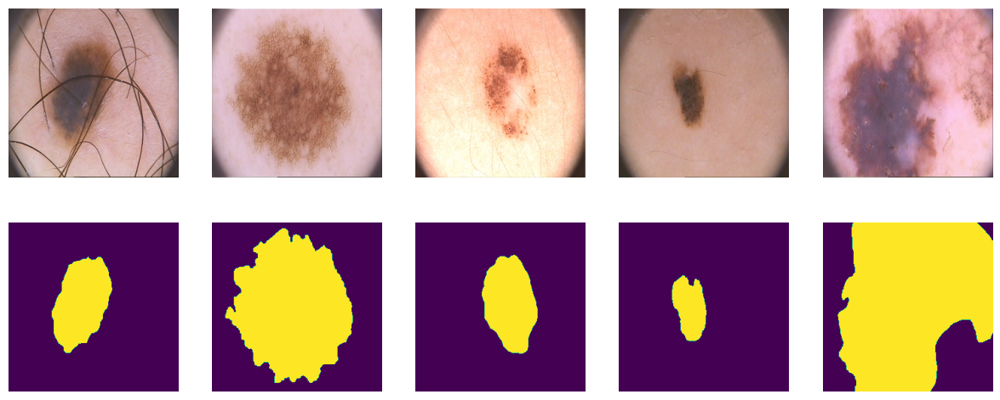

In [27]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(1, 6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим наши 200 картинок на 100/50/50
 для обучения, валидации и теста соответственно

In [9]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [10]:
print(len(tr), len(val), len(ts))

100 50 50


## PyTorch DataLoader

In [11]:
from torch.utils.data import DataLoader
batch_size = 25
train_dataloader = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])),
                     batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [12]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Метрика

## IoU (intersection over union)

В данном разделе предлагается использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


Что будет являться пересением и объединением в задаче сегментации?

Давайте разберем следующий пример:





<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1rBYFgli48AUUN9idiyq8j3J5DboB93yN" width=1000 height=800/></p>

In [13]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 45.6 MB/s eta 0:00:00


In [14]:
from torchmetrics import JaccardIndex

iou_score = JaccardIndex(threshold=0.5, task="binary", average='none').to(device)

# Построй свой первый бейзлайн!

Итак, загрузка файлов, код датасета и даталоадера написана за вас. Метрика IoU написана за вас! Вам остается написать лосс, модель и функции обучения и теста модели.

* Построй свой первый бейзлайн! [6]
  * BCE Loss [2]
  * SegNet [2]
  * Train [1]
  * Test [1]

## BCE Loss [2 балла]

Популярным лоссом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right] \space [1]$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right) \space [2]$$

### Вывод численно стабильной формулы BCE лосса [1 балл]



Выведите из формулы [1] формулу [2]:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right] \space [1]$$

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right) \space [2]$$

Не забываем, что здесь $\hat y_i$ - это логиты сети, не вероятности и не лейблы.

**Ответ:**
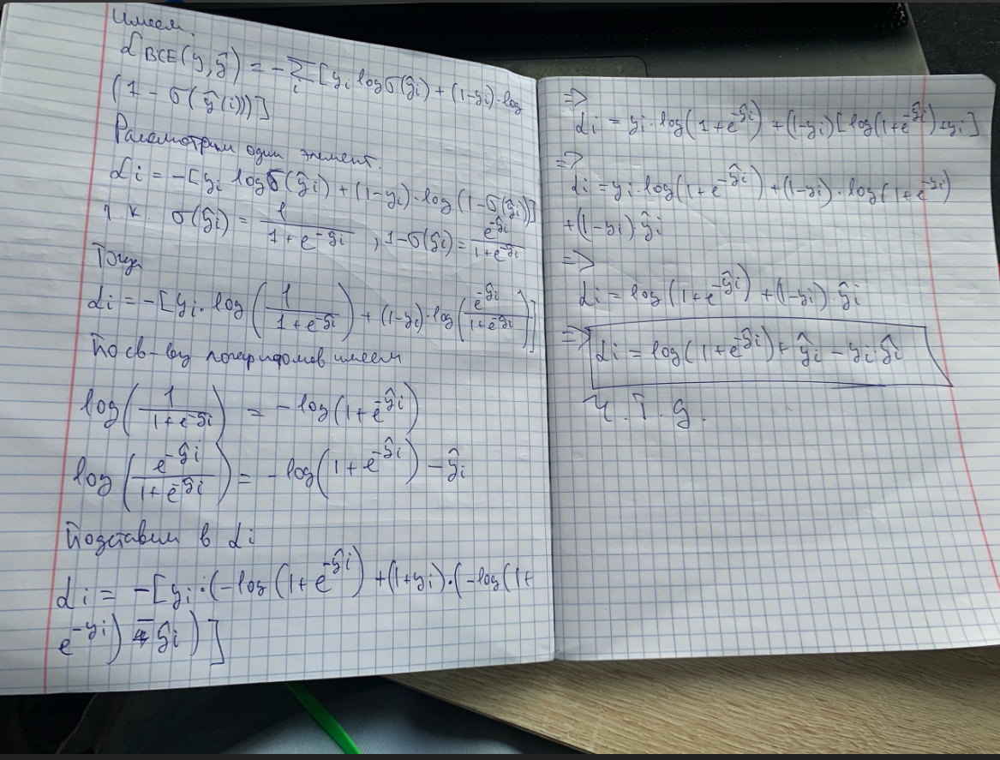

### Реализуйте в коде оба варианта лосса [1 балл]

Реализуйте следующие функции:

*   `bce_true()` - честная прямая реализация лосса с формулой $$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$
*   `bce_loss()` - реализация формулы, которую мы вывели $$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

И сравните результаты функций с реализацией Pytorch:
*   `bce_torch()`
*   `bce_torch_with_logits()`

In [15]:
import torch.nn.functional as F
import torch.nn as nn

In [16]:
bce_torch = nn.BCELoss(reduction='sum') # (sigmoid(y_pred), y_real)
bce_torch_with_logits = nn.BCEWithLogitsLoss(reduction='sum')

In [17]:
def bce_loss(y_pred, y_real):
  loss = torch.sum(y_pred - y_real * y_pred + torch.log(1 + torch.exp(-y_pred)))
  return loss

def bce_true(y_pred, y_real):
  probabilities = torch.sigmoid(y_pred)
  loss = -torch.sum(y_real * torch.log(probabilities) + (1 - y_real) * torch.log(1 - probabilities))
  return loss

Проверим корректность работы на простом примере

In [18]:
y_pred = torch.randn(3, 2, requires_grad=False)
y_true = torch.rand(3, 2, requires_grad=False)

print(f'BCE loss from scratch bce_loss = {bce_loss(y_pred, y_true)}')
print(f'BCE loss честно посчитанный = {bce_true(y_pred, y_true)}')
print(f'BCE loss from torch bce_torch = {bce_torch(torch.sigmoid(y_pred), y_true)}')
print(f'BCE loss from torch with logits bce_torch = {bce_torch_with_logits(y_pred, y_true)}')


BCE loss from scratch bce_loss = 5.335710048675537
BCE loss честно посчитанный = 5.335710048675537
BCE loss from torch bce_torch = 5.335710048675537
BCE loss from torch with logits bce_torch = 5.335710048675537


Инструкции `assert` в Python — это булевы выражения, которые проверяют, является ли условие истинным (`True`). Внизу в коде мы проверяем функция `bce_loss()` выдает тот же результат, что и функция из Pytorch или нет. Если равенства не будет, что будет означать, что результаты функций не совпадают, а значит вы неправильно реализовали фукнцию `bce_loss()`, `assert` возвратит ошибку.

Функция `numpy.isclose()` используется для сравнения двух чисел с учётом допустимой погрешности. Она особенно полезна при работе с числами с плавающей точкой, где точное сравнение может быть проблематичным из-за ограничений представления таких чисел в компьютере.

Как она работает?

`numpy.isclose(a, b, rtol=1e-05, atol=1e-08) `принимает два числа (`a` и `b`) и сравнивает их, учитывая относительную и абсолютную погрешность. Если разница между двумя числами меньше заданного порога, функция возвращает `True`, иначе — `False`.

Параметры:

    rtol: Относительная погрешность (по умолчанию 1e-05). Используется для определения разницы относительно большего значения.
    atol: Абсолютная погрешность (по умолчанию 1e-08). Определяет минимальную разницу, которую следует учитывать.

Мы будем использовать `assert` и `numpy.isclose()` для проверки корректности нашего кода.

In [19]:
assert np.isclose(bce_loss(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true))
assert np.isclose(bce_loss(y_pred, y_true), bce_torch_with_logits(y_pred, y_true))
assert np.isclose(bce_true(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true))
assert np.isclose(bce_true(y_pred, y_true), bce_torch_with_logits(y_pred, y_true))

Давайте теперь посчитаем на простом примере, но с теми же размерностями, что и в датасете

In [20]:
y_pred = torch.randn((2, 1, 3, 3), requires_grad=False)
y_true = torch.randint(0, 2, (2, 1, 3, 3))

print(f'BCE loss from scratch bce_loss = {bce_loss(y_pred, y_true)}')
print(f'BCE loss честно посчитанный = {bce_true(y_pred, y_true)}')
print(f'BCE loss from torch bce_torch = {bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float))}')
print(f'BCE loss from torch with logits bce_torch = {bce_torch_with_logits(y_pred, y_true.to(torch.float))}')

BCE loss from scratch bce_loss = 12.510417938232422
BCE loss честно посчитанный = 12.510417938232422
BCE loss from torch bce_torch = 12.510416984558105
BCE loss from torch with logits bce_torch = 12.510417938232422


In [21]:
assert np.isclose(bce_loss(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float)))
assert np.isclose(bce_loss(y_pred, y_true), bce_torch_with_logits(y_pred, y_true.to(torch.float)))
assert np.isclose(bce_true(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float)))
assert np.isclose(bce_true(y_pred, y_true), bce_torch_with_logits(y_pred, y_true.to(torch.float)))

Давайте посчитаем на реальных логитах и сегментационной маске:

In [23]:
!gdown --folder 1EX0RW1TRQVkLmR1h6miCQqyhYPFyg28M

Retrieving folder contents
Processing file 1--WxvBdpMn_NOmYPf3a4au8MHzfx5baC labels.pt
Processing file 1-0A7_CS_vKiSCkgIDJ4joThCEcFedA3I logits.pt
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1--WxvBdpMn_NOmYPf3a4au8MHzfx5baC
To: /content/for_asserts/labels.pt
100% 1.18k/1.18k [00:00<00:00, 5.65MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-0A7_CS_vKiSCkgIDJ4joThCEcFedA3I
To: /content/for_asserts/logits.pt
100% 1.18k/1.18k [00:00<00:00, 5.01MB/s]
Download completed


In [24]:
path_to_dummy_samples = '/content/for_asserts'
dummpy_sample = {'logits': torch.load(f'{path_to_dummy_samples}/logits.pt'),
                 'labels': torch.load(f'{path_to_dummy_samples}/labels.pt')}
dummpy_sample['labels'] = dummpy_sample['labels'].to(device)
dummpy_sample['logits'] = dummpy_sample['logits'].to(device)

<ipython-input-24-cd9dbfff2c1b>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  dummpy_sample = {'logits': torch.load(f'{path_to_dummy_samples}/logits.pt'),
<ipython-input-

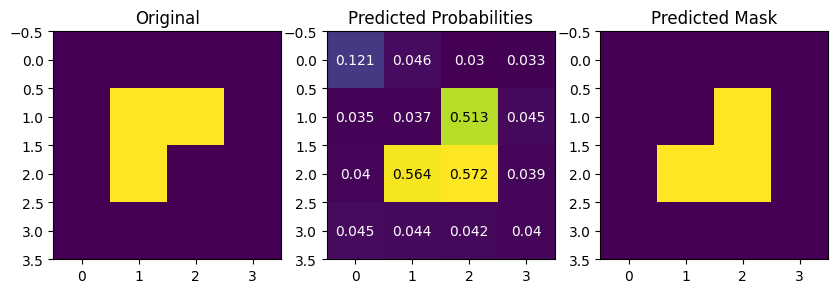

In [28]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize= (10,3*10))

ax1.imshow(dummpy_sample['labels'].squeeze(1)[0].cpu())
ax1.set_title("Original")

ax2.imshow(dummpy_sample['logits'].sigmoid().squeeze(1)[0].cpu())
for (j,i),label in np.ndenumerate(dummpy_sample['logits'].sigmoid().squeeze(1)[0].cpu()):
    if label < 0.5:
        color = 'white'
    else:
        color = 'black'
    ax2.text(i,j,round(label,3), color=color, ha='center',va='center')

ax2.set_title("Predicted Probabilities")

ax3.imshow((dummpy_sample['logits'].sigmoid() > 0.5).squeeze(1)[0].cpu())
ax3.set_title("Predicted Mask")
plt.show()

Проверяем на данном примере:

In [29]:
bce_loss_score = bce_loss(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu())
bce_true_score = bce_true(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu())
bce_torch_score = bce_torch(torch.sigmoid(dummpy_sample['logits'].cpu()), dummpy_sample['labels'].cpu().float())
bce_torch_with_logits_score = bce_torch_with_logits(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu().float())
assert np.isclose(bce_loss_score, bce_torch_score)
assert np.isclose(bce_loss_score, bce_torch_with_logits_score)
assert np.isclose(bce_true_score, bce_torch_score)
assert np.isclose(bce_true_score, bce_torch_with_logits_score)

## SegNet [2 балла]

Ваше задание здесь состоит в том, чтобы реализовать SegNet архитектуру.

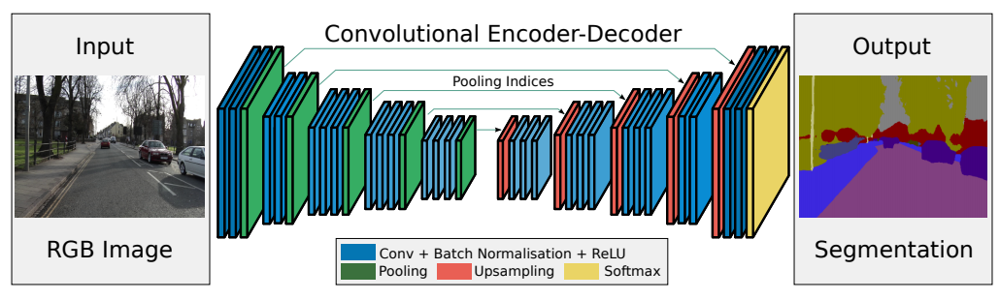

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

Внимательно посмотрите из чего состоит модель и для чего выбраны те или иные блоки.

In [30]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

Хорошие ресурсы по SegNet архитектуре:
1. https://medium.com/@nikdenof/segnet-from-scratch-using-pytorch-3fe9b4527239


In [31]:
class SegNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, features=64):
        super().__init__()

        # VGG-16 architecture
        self.enc_1 = self.encoder_layer(in_channels, features, depth=2)
        self.enc_2 = self.encoder_layer(features, 2 * features, depth=2)
        self.enc_3 = self.encoder_layer(2 * features, 4 * features, depth=3)
        self.enc_4 = self.encoder_layer(4 * features, 8 * features, depth=3)

        # bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(8 * features, 8 * features, kernel_size=3, padding=1),
            nn.BatchNorm2d(8 * features),
            nn.ReLU(inplace=True),
            nn.Conv2d(8 * features, 8 * features, kernel_size=3, padding=1),
            nn.BatchNorm2d(8 * features),
            nn.ReLU(inplace=True)
        )

        # decoder (upsampling)
        self.dec_4 = self.decoder_layer(8 * features, features * 4, depth=3)
        self.dec_3 = self.decoder_layer(4 * features, features * 2, depth=3)
        self.dec_2 = self.decoder_layer(2 * features, features, depth=2)
        self.dec_1 = self.decoder_layer(features, out_channels, depth=2)
        # pool and unpool
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        self.unpool = nn.MaxUnpool2d(kernel_size=2, stride=2)
        # TODO
    def encoder_layer(self, input, output, depth=3):
        layers = list()
        for i in range(depth):
            layers.append(nn.Conv2d(input, output, kernel_size=3, padding=1))
            layers.append(nn.BatchNorm2d(output))
            layers.append(nn.ReLU(inplace=True))
            input = output
        return nn.Sequential(*layers)

    def decoder_layer(self,input, output, depth=3):
        layers = list()
        for i in range(depth):
            layers.append(nn.Conv2d(input, output, kernel_size=3, padding=1))
            layers.append(nn.BatchNorm2d(output))
            layers.append(nn.ReLU(inplace=True))
            input = output
        return nn.Sequential(*layers)


    def forward(self, x):
        # encoder
        x1 = self.enc_1(x)
        x1, idx1 = self.pool(x1)

        x2 = self.enc_2(x1)
        x2, idx2 = self.pool(x2)

        x3 = self.enc_3(x2)
        x3, idx3 = self.pool(x3)

        x4 = self.enc_4(x3)
        x4, idx4 = self.pool(x4)
        # bottleneck
        x5 = self.bottleneck(x4)
        # decoder
        x4 = self.unpool(x5, idx4)
        x4 = self.dec_4(x4)

        x3 = self.unpool(x4, idx3)
        x3 = self.dec_3(x3)

        x2 = self.unpool(x3, idx2)
        x2 = self.dec_2(x2)

        x1 = self.unpool(x2, idx1)
        output  = self.dec_1(x1)
        # TODO

        return output # no activation

In [ ]:
segnet_model = SegNet().to(device)

## Тренировка [1 балл]

Напишите функцию для обучения модели.

In [32]:
from tqdm.notebook import tqdm

In [33]:
def train(model, optimizer, loss_func, epochs, train_dataloader, valid_dataloader, scheduler=None, metric_func=None):
    train_loss = list()
    valid_loss = list()
    metric_score = list()
    valid_loss_min = np.Inf
    for epoch in tqdm(range(epochs)):
        print(f'\n Epoch {epoch + 1} / {epochs}')
        #Переводим модель в train
        model.train()
        avarage_loss = 0
        for X, y in tqdm(train_dataloader, desc="Training"):
            X, y = X.to(device), y.to(device)
            #
            optimizer.zero_grad()
            y_pred = model(X)
            loss = loss_func(y_pred, y)

            loss.backward()
            optimizer.step()
            avarage_loss += loss.item() / len(train_dataloader)

        train_loss.append(avarage_loss)
        print(f'In epoches {epoch + 1} loss - {avarage_loss}')

        #Валидация
        model.eval()
        val_loss_epoch = 0
        y_pred_list = list()
        y_true_list = list()
        with torch.no_grad():
            for X_valid, y_valid in tqdm(valid_dataloader, desc="Validation"):
                X_valid, y_valid = X_valid.to(device), y_valid.to(device)
                Y_pred_val = model(X_valid)
                val_loss_epoch += loss_func(Y_pred_val, y_valid).item() / len(valid_dataloader)

                Y_pred_val = (Y_pred_val >= 0.5).float()
                y_pred_list.append(Y_pred_val)
                y_true_list.append(y_valid)
            #Вычисление метрики после эпохи
            y_pred_list = torch.cat(y_pred_list, dim=0)
            y_true_list = torch.cat(y_true_list, dim=0)
            metric_in_epoch = metric_func(y_pred_list, y_true_list).item()
            valid_loss.append(val_loss_epoch)
            metric_score.append(metric_in_epoch)
            print(f'Loss valid: {val_loss_epoch:.4f}, Metric(IoU): {metric_in_epoch:.4f}')
            if scheduler:
                scheduler.step(val_loss_epoch)

    print(f"\nFinal IoU: {metric_score[-1]:.4f}")
    return train_loss, valid_loss, metric_score

In [34]:
import random

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [37]:
model = SegNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
epochs = 35
criterion = bce_torch_with_logits
res = train(model, optimizer, criterion, epochs, train_dataloader, valid_dataloader, None, iou_score)

  0%|          | 0/35 [00:00<?, ?it/s]


 Epoch 1 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 1 loss - 1182578.0625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1135652.2500, Metric(IoU): 0.0000

 Epoch 2 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 2 loss - 1066078.03125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1135652.2500, Metric(IoU): 0.0000

 Epoch 3 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 3 loss - 1049749.296875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1135652.2500, Metric(IoU): 0.0000

 Epoch 4 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 4 loss - 1040547.875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1135652.2500, Metric(IoU): 0.0000

 Epoch 5 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 5 loss - 1035602.296875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1135652.2500, Metric(IoU): 0.0000

 Epoch 6 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 6 loss - 1029648.25


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1135652.2500, Metric(IoU): 0.0000

 Epoch 7 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 7 loss - 1040070.625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1135652.2500, Metric(IoU): 0.0000

 Epoch 8 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 8 loss - 1027744.859375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1135651.8750, Metric(IoU): 0.0000

 Epoch 9 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 9 loss - 1021063.28125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1131140.0625, Metric(IoU): 0.0162

 Epoch 10 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 10 loss - 1011652.828125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1122288.7500, Metric(IoU): 0.0510

 Epoch 11 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 11 loss - 1005800.578125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1073904.8750, Metric(IoU): 0.2260

 Epoch 12 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 12 loss - 997114.703125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1040361.0000, Metric(IoU): 0.3329

 Epoch 13 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 13 loss - 993398.9375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1035209.2812, Metric(IoU): 0.3792

 Epoch 14 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 14 loss - 988799.84375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1010594.5312, Metric(IoU): 0.4634

 Epoch 15 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 15 loss - 981354.15625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 952260.0312, Metric(IoU): 0.6229

 Epoch 16 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 16 loss - 978055.890625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 958079.1562, Metric(IoU): 0.6239

 Epoch 17 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 17 loss - 975613.390625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 985800.1250, Metric(IoU): 0.5863

 Epoch 18 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 18 loss - 970256.265625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 958320.5000, Metric(IoU): 0.6514

 Epoch 19 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 19 loss - 975589.734375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 947373.6250, Metric(IoU): 0.6961

 Epoch 20 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 20 loss - 963893.921875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 959505.0938, Metric(IoU): 0.7328

 Epoch 21 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 21 loss - 963823.84375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 953164.8750, Metric(IoU): 0.7133

 Epoch 22 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 22 loss - 960528.328125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 937832.6250, Metric(IoU): 0.7477

 Epoch 23 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 23 loss - 956036.109375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 953218.3438, Metric(IoU): 0.7240

 Epoch 24 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 24 loss - 954796.75


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 950268.6562, Metric(IoU): 0.7082

 Epoch 25 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 25 loss - 947875.28125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 945936.8438, Metric(IoU): 0.7244

 Epoch 26 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 26 loss - 941055.53125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 957702.3125, Metric(IoU): 0.7171

 Epoch 27 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 27 loss - 935810.84375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 951115.6875, Metric(IoU): 0.7116

 Epoch 28 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 28 loss - 936125.90625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 938041.5938, Metric(IoU): 0.7244

 Epoch 29 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 29 loss - 937401.578125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 934863.6875, Metric(IoU): 0.7704

 Epoch 30 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 30 loss - 944678.1875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 932235.5312, Metric(IoU): 0.7646

 Epoch 31 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 31 loss - 931097.796875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 936841.5938, Metric(IoU): 0.7493

 Epoch 32 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 32 loss - 929461.625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 939362.3750, Metric(IoU): 0.7629

 Epoch 33 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 33 loss - 923509.609375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 965174.1875, Metric(IoU): 0.7033

 Epoch 34 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 34 loss - 921108.25


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 933097.2500, Metric(IoU): 0.7735

 Epoch 35 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 35 loss - 927931.484375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 927246.4375, Metric(IoU): 0.7988

Final IoU: 0.7988


Обучите модель **SegNet**. В качестве оптимайзера можно взять Adam.

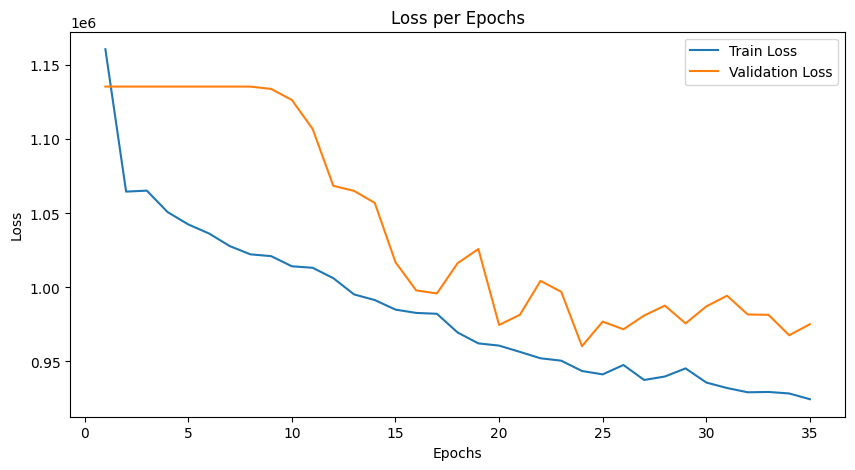

In [ ]:
 # графики потерь
plt.figure(figsize=(10, 5))
plt.plot(range(1, epochs + 1), res[0], label='Train Loss')
plt.plot(range(1, epochs + 1), res[1], label='Validation Loss')
plt.title('Loss per Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


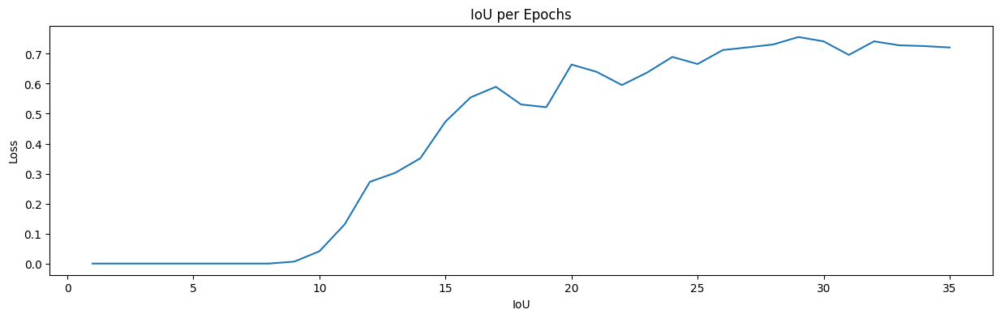

In [ ]:
plt.plot(range(1, epochs + 1), res[2], label='IoU')
plt.xlabel('IoU')
plt.ylabel('Loss')
plt.title('IoU per Epochs')
plt.show()

## Инференс [1 балл]

После обучения модели напишите фукнцию теста, воспользуйтесь лучшим чекпоинтом и протестируйте работу модели на тестовой выборке.

In [35]:
# функция тестировния
def test_model(model, test_dataloader, metric_fn):
    model.eval()
    metric_fn.reset()

    test_loss = 0
    with torch.no_grad():
        for X_batch, Y_batch in tqdm(test_dataloader):
            X_batch, Y_batch = X_batch.to(device), Y_batch.to(device)
            Y_pred = model(X_batch)
            Y_pred_bin = (Y_pred >= 0.5).float()
            metric_fn.update(Y_pred_bin.int(), Y_batch.int())

    test_metric_score = metric_fn.compute().item()
    print(f"Epoch IoU test: {test_metric_score:.4f}")

    return test_metric_score

In [38]:
# тестирование
test_score = test_model(
    model=model,
    test_dataloader=test_dataloader,
    metric_fn=iou_score,
)

print(f'SegNet IoU test: {test_score:.4f}')

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch IoU test: 0.7690
SegNet IoU test: 0.7690


# Мир других лоссов!

## Дополнительные функции потерь [2 балла]

В данном разделе вам потребуется имплементировать две функции потерь: DICE и Focal loss.


### Dice Loss

**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

В терминах матрицы ошибок она будет считаться следующим образом:

$$D(X,Y) = \frac{2TP}{2TP + FP + FN}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1- D(X, Y)$$

**Hints** (!):

1. Не забудьте подумать о численной нестабильности, возникающей в математической формуле при ситуации, когда $\frac{0}{0}$, т.е. вам нужно добавить очень маленькое число, например $\epsilon = 1e^{-8}$, в обе части дроби при подсчете $D(X,Y)$:

$$D(X,Y) = \frac{2TP + ϵ}{2TP + FP + FN + ϵ}$$

2. Dice метрика(!), не лосс, считается похожим образом как IoU:

    2.1. На вход вам приходят logits, т.е. значения от $-∞$ до $∞$. Их переводим в вероятности от 0 до 1 при помощи функции Sigmoid.

    2.2. Фиксируем порог, например threshold=0.5, и всему что ниже порога ставим значение 0, всему что выше 1. Получаем предсказанную маску из 0 и 1.

    2.3. Считаем TP, FP, FN

    2.4. Считаем DICE метрику по формуле

Вы можете прописать для себя функцию `dice_score()` и сравнить с результатами работы функции из библиотеки `torchmetrics`.

3. Но с метрикой есть проблема, что она не дифференцируема, и если вы захотите просто взять и прописать `dice_loss` = 1 - `dice_score`, Pytorch поругается на вас и скажет, что это недифференцируемая метрика. Чтобы посчитать dice_loss делаем следующие шаги:

    3.1. На вход вам приходят logits, т.е. значения от $-∞$ до $∞$. Их переводим в вероятности от 0 до 1 при помощи функции Sigmoid.

    3.2. Здесь нам уже не нужно фиксировать порог, мы просто работаем с вероятностями. Значения вероятностей дифференцируемы и через них будут протекать градиенты.

    3.3. Считаем TP, FP, FN также как и в Dice метрике, только вместо маски, подаем вероятности.

    3.4. Считаем DICE метрику по формуле

    3.5. Считаем лосс как Loss = 1 - DICE

Итак, давайте сначала пропишем dice_score.

In [39]:
def dice_score(logits: torch.Tensor, labels: torch.Tensor, threshold: float = 0.5):
    '''
    Это именно метрика, не лосс.
    '''
    y_pred = (torch.sigmoid(logits) >= threshold).float()
    intersection = torch.sum(y_pred * labels)
    total_pixels = torch.sum(y_pred) + torch.sum(labels)
    epsilon = 1e-8
    score = (2. * intersection + epsilon) / (total_pixels + epsilon)
    return score

Проверим на корректность функцию dice_score:

In [40]:
from torchmetrics.classification import Dice

dice = Dice(average='micro').to(device)
dice(dummpy_sample['logits'].sigmoid(), dummpy_sample['labels'].to(int))

tensor(0.6667, device='cuda:0')

In [41]:
assert dice(dummpy_sample['logits'].sigmoid(), dummpy_sample['labels'].to(int)) == dice_score(dummpy_sample['logits'], dummpy_sample['labels'])

Давайте теперь пропишем лосс и воспользуемся библиотекой `segmentation-models-pytorch`, чтобы убедиться в корректности нашей функции.

In [42]:
def dice_loss(logits: torch.Tensor, labels: torch.Tensor):

    '''
    Это лосс.
    '''
    y_pred = torch.sigmoid(logits)
    intersection = torch.sum(y_pred * labels)
    total_pixels = torch.sum(y_pred) + torch.sum(labels)
    dice_coeff = (2. * intersection) / (total_pixels + 1e-8)
    loss = 1 - dice_coeff
    return loss

Проверка на корректность:

In [43]:
!pip install segmentation-models-pytorch
from segmentation_models_pytorch.losses import DiceLoss
dice_loss_torch = DiceLoss(mode='binary')
dice_loss_torch(dummpy_sample['logits'], dummpy_sample['labels'])

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.5/109.5 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 82.6 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16424 sha256=137928a60492428d7278ed420c7e3ea04e40b3488f5906890b8d5d36decf9ae2
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60944 sha256=4a8b866f5649205f4e67fbb52ae3fe979d4d6c55a3c855c151741b2b5684862f
  Stored in directory: /root/.cache/pip/wheels/35/cb/a5/8f534c60142835bfc889f9a482e4a67e0b817032d9c6883b64
Successfully built efficientnet-pytorch

tensor(0.5756, device='cuda:0')

In [44]:
assert dice_loss_torch(dummpy_sample['logits'], dummpy_sample['labels'].to(int)) == dice_loss(dummpy_sample['logits'], dummpy_sample['labels'])

### Focal Loss

[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf)

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.


Из оригинальной статьи по [Focal Loss](https://arxiv.org/pdf/1708.02002.pdf):

$$p_t = \sigma(\hat y_i)y_i + (1 - \sigma(\hat y_i)) (1-y_i)$$

$$\mathcal L_{focal}(y, \hat y) = (1 - p_t)^{\gamma} \mathcal L_{BCE}(y_i, \hat y_i).$$

$$\mathcal L_{focal}(y, \hat y) = -\sum_i (1 - p_t)^{\gamma} \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

$$\mathcal L_{focal}(y, \hat y) = -\sum_i (1 - (\sigma(\hat y_i)y_i + (1 - \sigma(\hat y_i)) (1-y_i)))^{\gamma} \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

In [45]:
def focal_loss(y_real, y_pred, alpha=0.25, gamma=2, eps=1e-8):
    probs = torch.sigmoid(y_pred)
    p_t = probs * y_real + (1 - probs) * (1 - y_real)
    alpha_t = alpha * y_real + (1 - alpha) * (1 - y_real)
    loss = -alpha_t * (1 - p_t) ** gamma * torch.log(p_t + eps)
    return loss.mean()

Проверка корректности функции:

In [46]:
def focal_loss(y_real, y_pred, alpha=0.25, gamma=2, eps=1e-8):
    probs = torch.sigmoid(y_pred)
    p_t = probs * y_real + (1 - probs) * (1 - y_real)
    alpha_t = alpha * y_real + (1 - alpha) * (1 - y_real)
    loss = -alpha_t * (1 - p_t) ** gamma * torch.log(p_t + eps)
    return loss.mean()

In [47]:
from torchvision.ops import sigmoid_focal_loss
sigmoid_focal_loss(dummpy_sample['logits'], dummpy_sample['labels'], alpha=0.25, gamma=2, reduction='mean')

tensor(0.0653, device='cuda:0')

In [48]:
focal_loss(dummpy_sample['labels'], dummpy_sample['logits'], gamma=2.0)

tensor(0.0653, device='cuda:0')

In [49]:
assert sigmoid_focal_loss(dummpy_sample['logits'], dummpy_sample['labels'], alpha=0.25, gamma=2, reduction='mean') == focal_loss(dummpy_sample['labels'], dummpy_sample['logits'], eps=1e-8, gamma=2.0)

## [BONUS] Мир сегментационных лоссов [5 баллов]

В данном блоке предлагаем вам написать одну функцию потерь самостоятельно. Для этого необходимо прочитать статью и имплементировать ее, и провести численное сравнение с предыдущими функциями.

* [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)". IEEE Access, 6, 53930-53943.

* [Boundary loss for highly unbalanced segmentation](https://arxiv.org/abs/1812.07032)

* [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

* [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

* [Topology-Preserving Deep Image Segmentation](https://papers.nips.cc/paper/8803-topology-preserving-deep-image-segmentation)

In [50]:
def tverskyloss(targets, inputs):
    smooth = 1
    alpha = 0.5
    beta = 0.5
    inputs = torch.sigmoid(inputs).view(-1)
    targets = targets.view(-1)
    intersection = (inputs * targets).sum()
    FP = ((1-targets) * inputs).sum()
    FN = (targets * (1-inputs)).sum()
    Tversky = (intersection + smooth) / (intersection + alpha*FP + beta*FN + smooth)

    return 1 - Tversky

## Обучите SegNet на новых лоссах

**Задание**: обучите SegNet на новых лоссах и сравните все три лосса:
*   При каком лоссе модель сходится быстрее?
*   При каком лоссе модель выдает наилучшую метрику?

Напишите развернутый ответ на вопросы.



In [53]:
loss_functions = {
    'FocalLoss': lambda Y_pred, Y_batch: sigmoid_focal_loss(Y_pred, Y_batch, alpha=0.25, gamma=2, reduction='mean'),
    'Tversky': tverskyloss,
    'DiceLoss': dice_loss
}
list_plot = list()
for loss_name, loss_fn in loss_functions.items():
    print('------------------------------------------------')
    print(f'ОБУЧЕНИЕ c {loss_name}')


    model = SegNet().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    epochs = 35
    criterion = bce_torch_with_logits
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        patience=3,
        threshold=1e-4,
        mode="min"
    )
    res = train(model, optimizer, loss_fn, epochs, train_dataloader, valid_dataloader, scheduler, iou_score)
    list_plot.append(res)

------------------------------------------------
ОБУЧЕНИЕ c FocalLoss


  0%|          | 0/35 [00:00<?, ?it/s]


 Epoch 1 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 1 loss - 0.15808814950287342


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1010, Metric(IoU): 0.0000

 Epoch 2 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 2 loss - 0.09808687679469585


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1010, Metric(IoU): 0.0000

 Epoch 3 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 3 loss - 0.09823312237858772


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1010, Metric(IoU): 0.0000

 Epoch 4 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 4 loss - 0.09691657684743404


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1010, Metric(IoU): 0.0000

 Epoch 5 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 5 loss - 0.09664827398955822


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1010, Metric(IoU): 0.0000

 Epoch 6 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 6 loss - 0.0963000301271677


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1010, Metric(IoU): 0.0000

 Epoch 7 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 7 loss - 0.09617197513580322


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1010, Metric(IoU): 0.0000

 Epoch 8 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 8 loss - 0.09617459960281849


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1010, Metric(IoU): 0.0000

 Epoch 9 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 9 loss - 0.09616660140454769


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1010, Metric(IoU): 0.0000

 Epoch 10 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 10 loss - 0.09602576680481434


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1010, Metric(IoU): 0.0000

 Epoch 11 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 11 loss - 0.09587440825998783


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1009, Metric(IoU): 0.0036

 Epoch 12 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 12 loss - 0.09615169651806355


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1004, Metric(IoU): 0.0346

 Epoch 13 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 13 loss - 0.09589683450758457


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0994, Metric(IoU): 0.1041

 Epoch 14 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 14 loss - 0.09584459848701954


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0981, Metric(IoU): 0.1945

 Epoch 15 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 15 loss - 0.0958555992692709


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0971, Metric(IoU): 0.2716

 Epoch 16 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 16 loss - 0.095915038138628


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0967, Metric(IoU): 0.3251

 Epoch 17 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 17 loss - 0.09593180008232594


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0971, Metric(IoU): 0.3629

 Epoch 18 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 18 loss - 0.09578287973999977


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0981, Metric(IoU): 0.3776

 Epoch 19 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 19 loss - 0.09585484303534031


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0991, Metric(IoU): 0.3850

 Epoch 20 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 20 loss - 0.09640642814338207


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1001, Metric(IoU): 0.3936

 Epoch 21 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 21 loss - 0.09573991782963276


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1007, Metric(IoU): 0.3908

 Epoch 22 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 22 loss - 0.0958964079618454


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1012, Metric(IoU): 0.3959

 Epoch 23 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 23 loss - 0.0958009585738182


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1014, Metric(IoU): 0.3965

 Epoch 24 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 24 loss - 0.09586726874113083


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1017, Metric(IoU): 0.3941

 Epoch 25 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 25 loss - 0.09572697430849075


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1019, Metric(IoU): 0.3912

 Epoch 26 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 26 loss - 0.09581629186868668


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1018, Metric(IoU): 0.3900

 Epoch 27 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 27 loss - 0.09570972248911858


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1021, Metric(IoU): 0.3910

 Epoch 28 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 28 loss - 0.095799645408988


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1022, Metric(IoU): 0.3923

 Epoch 29 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 29 loss - 0.09573335200548172


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1023, Metric(IoU): 0.3928

 Epoch 30 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 30 loss - 0.09573638066649437


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1023, Metric(IoU): 0.3905

 Epoch 31 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 31 loss - 0.09582020156085491


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1027, Metric(IoU): 0.3943

 Epoch 32 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 32 loss - 0.09598325192928314


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1028, Metric(IoU): 0.4013

 Epoch 33 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 33 loss - 0.09574818424880505


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1027, Metric(IoU): 0.3973

 Epoch 34 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 34 loss - 0.09583625011146069


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1024, Metric(IoU): 0.3945

 Epoch 35 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 35 loss - 0.09579231962561607


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1022, Metric(IoU): 0.3921

Final IoU: 0.3921
------------------------------------------------
ОБУЧЕНИЕ c Tversky


  0%|          | 0/35 [00:00<?, ?it/s]


 Epoch 1 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 1 loss - 0.5465701669454575


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.9933, Metric(IoU): 0.0000

 Epoch 2 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 2 loss - 0.5294796973466873


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.9245, Metric(IoU): 0.0000

 Epoch 3 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 3 loss - 0.5188897103071213


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.9043, Metric(IoU): 0.0000

 Epoch 4 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 4 loss - 0.4813210070133209


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.9025, Metric(IoU): 0.0000

 Epoch 5 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 5 loss - 0.4367833137512207


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.9181, Metric(IoU): 0.0000

 Epoch 6 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 6 loss - 0.4170372039079666


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.9405, Metric(IoU): 0.0006

 Epoch 7 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 7 loss - 0.40197886526584625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.9118, Metric(IoU): 0.0261

 Epoch 8 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 8 loss - 0.39518582820892334


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.8795, Metric(IoU): 0.1665

 Epoch 9 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 9 loss - 0.38899892568588257


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.7389, Metric(IoU): 0.4710

 Epoch 10 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 10 loss - 0.38177767395973206


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6431, Metric(IoU): 0.6163

 Epoch 11 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 11 loss - 0.3838323652744293


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6030, Metric(IoU): 0.6293

 Epoch 12 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 12 loss - 0.3813641667366028


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5692, Metric(IoU): 0.6292

 Epoch 13 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 13 loss - 0.37541648745536804


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4898, Metric(IoU): 0.7322

 Epoch 14 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 14 loss - 0.36976513266563416


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4291, Metric(IoU): 0.7843

 Epoch 15 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 15 loss - 0.36924436688423157


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3998, Metric(IoU): 0.7947

 Epoch 16 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 16 loss - 0.36419036984443665


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4039, Metric(IoU): 0.7874

 Epoch 17 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 17 loss - 0.36884698271751404


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3887, Metric(IoU): 0.7968

 Epoch 18 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 18 loss - 0.3661014437675476


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3687, Metric(IoU): 0.7950

 Epoch 19 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 19 loss - 0.36806853115558624


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3796, Metric(IoU): 0.8006

 Epoch 20 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 20 loss - 0.3615150898694992


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3839, Metric(IoU): 0.8061

 Epoch 21 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 21 loss - 0.3578425347805023


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3819, Metric(IoU): 0.8067

 Epoch 22 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 22 loss - 0.3585628420114517


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3700, Metric(IoU): 0.8176

 Epoch 23 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 23 loss - 0.36006997525691986


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3638, Metric(IoU): 0.8206

 Epoch 24 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 24 loss - 0.35732951760292053


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3645, Metric(IoU): 0.8237

 Epoch 25 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 25 loss - 0.3555125296115875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3543, Metric(IoU): 0.8253

 Epoch 26 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 26 loss - 0.35391445457935333


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3546, Metric(IoU): 0.8260

 Epoch 27 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 27 loss - 0.35686495900154114


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3547, Metric(IoU): 0.8269

 Epoch 28 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 28 loss - 0.35475294291973114


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3520, Metric(IoU): 0.8270

 Epoch 29 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 29 loss - 0.35403552651405334


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3534, Metric(IoU): 0.8275

 Epoch 30 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 30 loss - 0.35864464938640594


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3540, Metric(IoU): 0.8286

 Epoch 31 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 31 loss - 0.3564869910478592


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3508, Metric(IoU): 0.8293

 Epoch 32 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 32 loss - 0.35623757541179657


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3533, Metric(IoU): 0.8290

 Epoch 33 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 33 loss - 0.3618810921907425


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3572, Metric(IoU): 0.8265

 Epoch 34 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 34 loss - 0.3559073358774185


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3539, Metric(IoU): 0.8290

 Epoch 35 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 35 loss - 0.35438570380210876


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3524, Metric(IoU): 0.8321

Final IoU: 0.8321
------------------------------------------------
ОБУЧЕНИЕ c DiceLoss


  0%|          | 0/35 [00:00<?, ?it/s]


 Epoch 1 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 1 loss - 0.5339523404836655


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5995, Metric(IoU): 0.0000

 Epoch 2 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 2 loss - 0.5053542107343674


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5990, Metric(IoU): 0.0000

 Epoch 3 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 3 loss - 0.4894960820674896


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6003, Metric(IoU): 0.0000

 Epoch 4 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 4 loss - 0.47802823781967163


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5990, Metric(IoU): 0.0000

 Epoch 5 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 5 loss - 0.4770888388156891


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5990, Metric(IoU): 0.0000

 Epoch 6 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 6 loss - 0.4644407629966736


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5990, Metric(IoU): 0.0000

 Epoch 7 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 7 loss - 0.46339350938796997


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5992, Metric(IoU): 0.0000

 Epoch 8 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 8 loss - 0.4613690674304962


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5959, Metric(IoU): 0.0168

 Epoch 9 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 9 loss - 0.45541509985923767


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5546, Metric(IoU): 0.2734

 Epoch 10 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 10 loss - 0.454438254237175


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5017, Metric(IoU): 0.5674

 Epoch 11 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 11 loss - 0.45231106877326965


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4566, Metric(IoU): 0.6930

 Epoch 12 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 12 loss - 0.45009365677833557


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4428, Metric(IoU): 0.7219

 Epoch 13 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 13 loss - 0.451811283826828


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4620, Metric(IoU): 0.7498

 Epoch 14 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 14 loss - 0.44628584384918213


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4361, Metric(IoU): 0.7766

 Epoch 15 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 15 loss - 0.4492465406656265


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4238, Metric(IoU): 0.8048

 Epoch 16 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 16 loss - 0.4435282349586487


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4314, Metric(IoU): 0.8086

 Epoch 17 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 17 loss - 0.4506922513246536


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4394, Metric(IoU): 0.8089

 Epoch 18 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 18 loss - 0.4405394047498703


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4150, Metric(IoU): 0.8286

 Epoch 19 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 19 loss - 0.44357161223888397


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4203, Metric(IoU): 0.8312

 Epoch 20 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 20 loss - 0.4421617239713669


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4419, Metric(IoU): 0.8189

 Epoch 21 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 21 loss - 0.44068534672260284


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4324, Metric(IoU): 0.8286

 Epoch 22 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 22 loss - 0.43977828323841095


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4416, Metric(IoU): 0.8271

 Epoch 23 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 23 loss - 0.4390093982219696


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4430, Metric(IoU): 0.8297

 Epoch 24 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 24 loss - 0.44019779562950134


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4427, Metric(IoU): 0.8293

 Epoch 25 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 25 loss - 0.4401881694793701


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4449, Metric(IoU): 0.8301

 Epoch 26 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 26 loss - 0.43739454448223114


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4436, Metric(IoU): 0.8298

 Epoch 27 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 27 loss - 0.4375001937150955


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4428, Metric(IoU): 0.8315

 Epoch 28 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 28 loss - 0.4372766613960266


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4442, Metric(IoU): 0.8324

 Epoch 29 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 29 loss - 0.4412869065999985


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4427, Metric(IoU): 0.8327

 Epoch 30 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 30 loss - 0.4373367875814438


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4428, Metric(IoU): 0.8337

 Epoch 31 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 31 loss - 0.43713273108005524


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4453, Metric(IoU): 0.8335

 Epoch 32 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 32 loss - 0.43925169110298157


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4433, Metric(IoU): 0.8337

 Epoch 33 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 33 loss - 0.4391489773988724


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4424, Metric(IoU): 0.8341

 Epoch 34 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 34 loss - 0.44043953716754913


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4428, Metric(IoU): 0.8335

 Epoch 35 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 35 loss - 0.4386059045791626


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4445, Metric(IoU): 0.8338

Final IoU: 0.8338


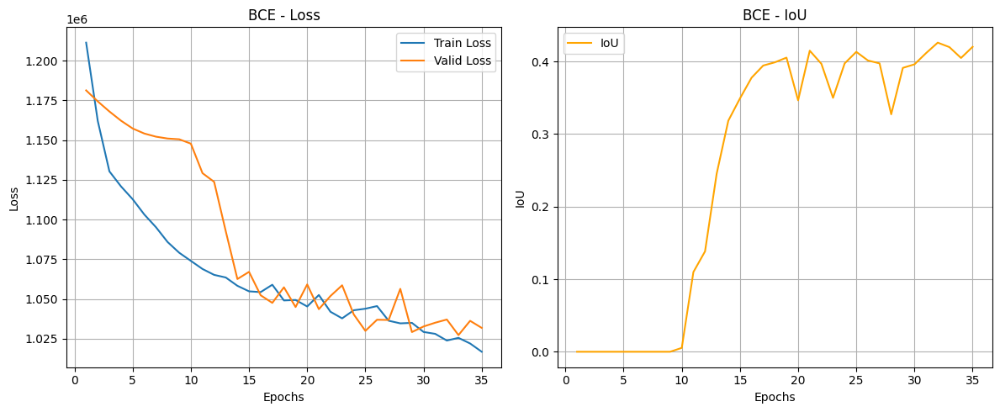

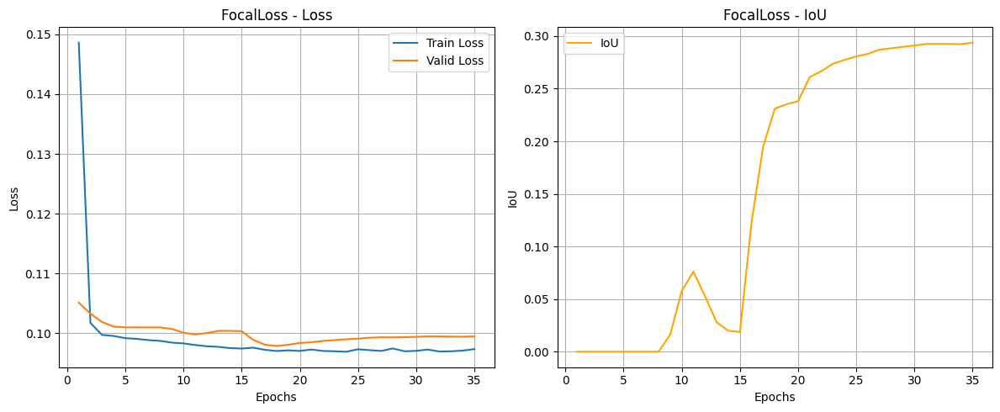

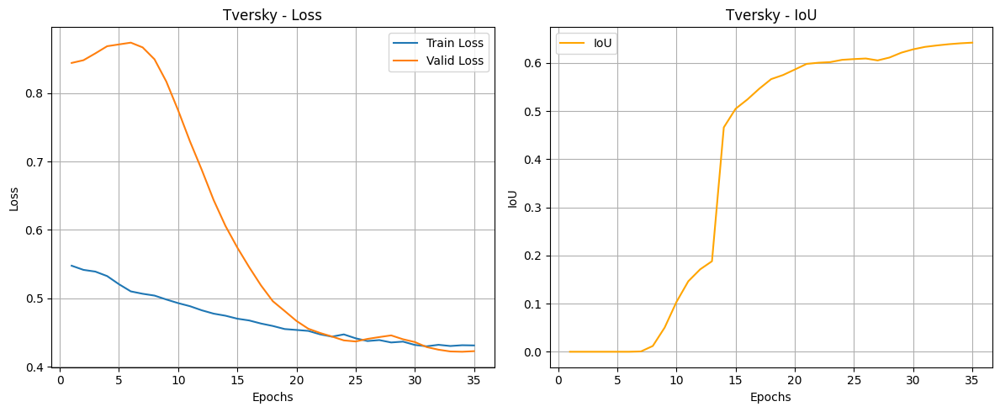

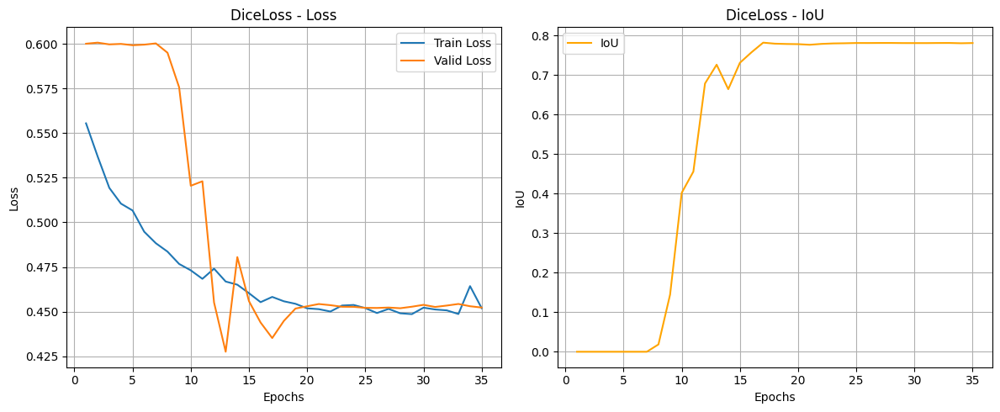

In [65]:
import matplotlib.pyplot as plt

# Создаем график для каждой функции потерь
for idx, res in enumerate(list_plot_seg):
    train_loss, valid_loss, metric_score = res

    # Определение названия функции потерь
    loss_name = list(loss_functions.keys())[idx]

    # Создаем фигуру
    plt.figure(figsize=(12, 5))

    # Подграфик 1: Loss
    plt.subplot(1, 2, 1)
    plt.plot(range(1, len(train_loss) + 1), train_loss, label="Train Loss")
    plt.plot(range(1, len(valid_loss) + 1), valid_loss, label="Valid Loss")
    plt.title(f"{loss_name} - Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid()

    # Подграфик 2: IoU
    plt.subplot(1, 2, 2)
    plt.plot(range(1, len(metric_score) + 1), metric_score, label="IoU", color='orange')
    plt.title(f"{loss_name} - IoU")
    plt.xlabel("Epochs")
    plt.ylabel("IoU")
    plt.legend()
    plt.grid()

    # Отображаем график
    plt.tight_layout()
    plt.show()


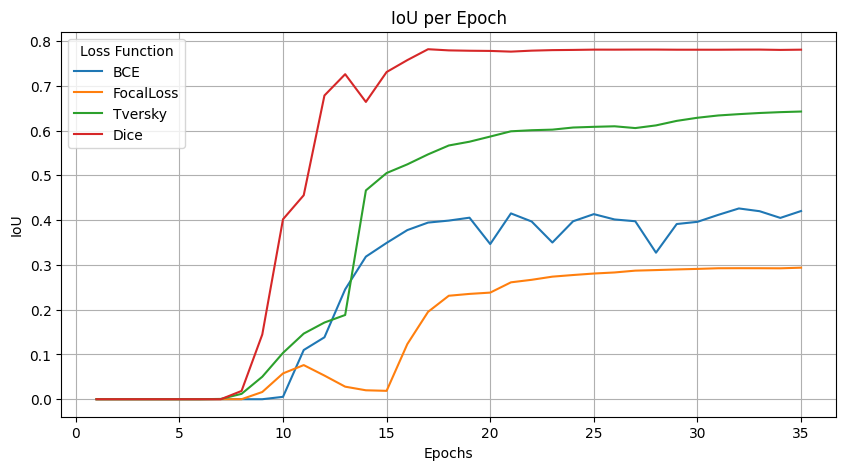

In [68]:
# Список с названиями метрик
loss_titles = ["BCЕ","FocalLoss", "Tversky", "Dice"]

plt.figure(figsize=(10, 5))
plt.xlabel('Epochs')
plt.ylabel('IoU')

# Проходим по результатам и добавляем в график
for result, res in enumerate(list_plot_seg):
    if result < len(loss_titles):  # Проверка на случай ошибки
        title = loss_titles[result]
        plt.plot(range(1, epochs + 1), res[2], label=title)  # Используем имя метрики

plt.title('IoU per Epoch')
plt.legend(title="Loss Function")  # Заголовок легенды
plt.grid(True)  # Добавим сетку для лучшей читаемости
plt.show()


Видно что DICE имеет высшую точность по iOU, однако сходимость при обучении у tversky более плавная


# Новая модель!

In [64]:
loss_functions = {
    'BCE': bce_torch_with_logits,
    'FocalLoss': lambda Y_pred, Y_batch: sigmoid_focal_loss(Y_pred, Y_batch, alpha=0.25, gamma=2, reduction='mean'),
    'Tversky': tverskyloss,
    'DiceLoss': dice_loss
}
list_plot_seg = list()
for loss_name, loss_fn in loss_functions.items():
    print('------------------------------------------------')
    print(f'ОБУЧЕНИЕ c {loss_name}')


    model = SegNet().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    epochs = 35
    criterion = bce_torch_with_logits
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        patience=3,
        threshold=1e-4,
        mode="min"
    )
    res = train(model, optimizer, loss_fn, epochs, train_dataloader, valid_dataloader, scheduler, iou_score)
    list_plot_seg.append(res)

------------------------------------------------
ОБУЧЕНИЕ c BCE


  0%|          | 0/35 [00:00<?, ?it/s]


 Epoch 1 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 1 loss - 1211321.5625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1181284.7500, Metric(IoU): 0.0000

 Epoch 2 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 2 loss - 1162044.28125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1174349.1250, Metric(IoU): 0.0000

 Epoch 3 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 3 loss - 1130328.78125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1168003.7500, Metric(IoU): 0.0000

 Epoch 4 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 4 loss - 1120847.15625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1162199.8125, Metric(IoU): 0.0000

 Epoch 5 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 5 loss - 1112801.40625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1157305.7500, Metric(IoU): 0.0000

 Epoch 6 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 6 loss - 1103179.90625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1154137.0625, Metric(IoU): 0.0000

 Epoch 7 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 7 loss - 1095210.3125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1152159.4375, Metric(IoU): 0.0000

 Epoch 8 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 8 loss - 1085885.625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1150992.2500, Metric(IoU): 0.0000

 Epoch 9 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 9 loss - 1079130.3125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1150522.5000, Metric(IoU): 0.0000

 Epoch 10 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 10 loss - 1074013.40625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1147763.4375, Metric(IoU): 0.0053

 Epoch 11 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 11 loss - 1068921.46875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1129208.8750, Metric(IoU): 0.1098

 Epoch 12 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 12 loss - 1065211.8125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1123732.6250, Metric(IoU): 0.1383

 Epoch 13 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 13 loss - 1063559.5


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1092668.2500, Metric(IoU): 0.2453

 Epoch 14 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 14 loss - 1058340.21875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1062594.9062, Metric(IoU): 0.3184

 Epoch 15 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 15 loss - 1054849.75


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1067100.8750, Metric(IoU): 0.3490

 Epoch 16 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 16 loss - 1054372.34375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1052366.9375, Metric(IoU): 0.3776

 Epoch 17 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 17 loss - 1059004.46875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1047588.2500, Metric(IoU): 0.3944

 Epoch 18 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 18 loss - 1049117.25


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1057385.7812, Metric(IoU): 0.3988

 Epoch 19 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 19 loss - 1049420.171875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1044973.8750, Metric(IoU): 0.4053

 Epoch 20 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 20 loss - 1045321.71875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1059201.3125, Metric(IoU): 0.3465

 Epoch 21 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 21 loss - 1052544.40625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1043635.6875, Metric(IoU): 0.4149

 Epoch 22 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 22 loss - 1041988.796875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1051913.5625, Metric(IoU): 0.3968

 Epoch 23 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 23 loss - 1037842.4375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1058653.9375, Metric(IoU): 0.3499

 Epoch 24 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 24 loss - 1042956.25


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1040321.7188, Metric(IoU): 0.3974

 Epoch 25 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 25 loss - 1043916.578125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1029979.9688, Metric(IoU): 0.4133

 Epoch 26 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 26 loss - 1045579.234375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1036979.8750, Metric(IoU): 0.4014

 Epoch 27 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 27 loss - 1036361.59375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1036837.8125, Metric(IoU): 0.3974

 Epoch 28 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 28 loss - 1034705.46875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1056420.9375, Metric(IoU): 0.3272

 Epoch 29 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 29 loss - 1035018.5


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1029227.0625, Metric(IoU): 0.3912

 Epoch 30 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 30 loss - 1029295.40625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1032730.0938, Metric(IoU): 0.3961

 Epoch 31 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 31 loss - 1028109.171875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1035113.1875, Metric(IoU): 0.4116

 Epoch 32 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 32 loss - 1023883.5625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1037119.3438, Metric(IoU): 0.4260

 Epoch 33 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 33 loss - 1025584.015625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1027321.7500, Metric(IoU): 0.4198

 Epoch 34 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 34 loss - 1022041.375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1036301.1250, Metric(IoU): 0.4048

 Epoch 35 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 35 loss - 1016842.03125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1031851.3438, Metric(IoU): 0.4202

Final IoU: 0.4202
------------------------------------------------
ОБУЧЕНИЕ c FocalLoss


  0%|          | 0/35 [00:00<?, ?it/s]


 Epoch 1 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 1 loss - 0.14861583709716797


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1051, Metric(IoU): 0.0000

 Epoch 2 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 2 loss - 0.1017192080616951


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1033, Metric(IoU): 0.0000

 Epoch 3 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 3 loss - 0.09970245137810707


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1019, Metric(IoU): 0.0000

 Epoch 4 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 4 loss - 0.09952853247523308


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1011, Metric(IoU): 0.0000

 Epoch 5 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 5 loss - 0.09916694462299347


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1010, Metric(IoU): 0.0000

 Epoch 6 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 6 loss - 0.0990400929003954


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1010, Metric(IoU): 0.0000

 Epoch 7 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 7 loss - 0.0988316535949707


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1010, Metric(IoU): 0.0000

 Epoch 8 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 8 loss - 0.09870695695281029


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1010, Metric(IoU): 0.0000

 Epoch 9 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 9 loss - 0.0984190758317709


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1007, Metric(IoU): 0.0161

 Epoch 10 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 10 loss - 0.09828687645494938


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1001, Metric(IoU): 0.0576

 Epoch 11 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 11 loss - 0.09801551699638367


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0998, Metric(IoU): 0.0762

 Epoch 12 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 12 loss - 0.09780964441597462


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1000, Metric(IoU): 0.0528

 Epoch 13 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 13 loss - 0.09770669415593147


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1004, Metric(IoU): 0.0280

 Epoch 14 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 14 loss - 0.09749954007565975


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1004, Metric(IoU): 0.0200

 Epoch 15 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 15 loss - 0.09742743521928787


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1003, Metric(IoU): 0.0187

 Epoch 16 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 16 loss - 0.09757297858595848


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0989, Metric(IoU): 0.1231

 Epoch 17 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 17 loss - 0.09721317887306213


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0981, Metric(IoU): 0.1951

 Epoch 18 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 18 loss - 0.0970110259950161


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0978, Metric(IoU): 0.2310

 Epoch 19 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 19 loss - 0.09712662175297737


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0981, Metric(IoU): 0.2352

 Epoch 20 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 20 loss - 0.09702525474131107


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0983, Metric(IoU): 0.2381

 Epoch 21 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 21 loss - 0.09726021625101566


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0985, Metric(IoU): 0.2610

 Epoch 22 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 22 loss - 0.0970198605209589


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0987, Metric(IoU): 0.2667

 Epoch 23 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 23 loss - 0.09696789644658566


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0988, Metric(IoU): 0.2737

 Epoch 24 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 24 loss - 0.09688910469412804


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0990, Metric(IoU): 0.2773

 Epoch 25 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 25 loss - 0.0973063986748457


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0991, Metric(IoU): 0.2806

 Epoch 26 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 26 loss - 0.0971552561968565


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0992, Metric(IoU): 0.2830

 Epoch 27 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 27 loss - 0.09702753648161888


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0993, Metric(IoU): 0.2871

 Epoch 28 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 28 loss - 0.09744071960449219


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0993, Metric(IoU): 0.2884

 Epoch 29 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 29 loss - 0.09696623496711254


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0993, Metric(IoU): 0.2898

 Epoch 30 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 30 loss - 0.09703856334090233


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0994, Metric(IoU): 0.2910

 Epoch 31 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 31 loss - 0.09725395403802395


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0995, Metric(IoU): 0.2924

 Epoch 32 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 32 loss - 0.09693121537566185


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0995, Metric(IoU): 0.2926

 Epoch 33 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 33 loss - 0.09696658328175545


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0994, Metric(IoU): 0.2925

 Epoch 34 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 34 loss - 0.09707953222095966


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0994, Metric(IoU): 0.2923

 Epoch 35 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 35 loss - 0.09733608737587929


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0995, Metric(IoU): 0.2937

Final IoU: 0.2937
------------------------------------------------
ОБУЧЕНИЕ c Tversky


  0%|          | 0/35 [00:00<?, ?it/s]


 Epoch 1 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 1 loss - 0.547694593667984


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.8440, Metric(IoU): 0.0000

 Epoch 2 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 2 loss - 0.5416227132081985


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.8480, Metric(IoU): 0.0000

 Epoch 3 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 3 loss - 0.5391100198030472


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.8580, Metric(IoU): 0.0000

 Epoch 4 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 4 loss - 0.5325396060943604


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.8685, Metric(IoU): 0.0000

 Epoch 5 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 5 loss - 0.5206407606601715


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.8711, Metric(IoU): 0.0000

 Epoch 6 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 6 loss - 0.5101888030767441


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.8737, Metric(IoU): 0.0000

 Epoch 7 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 7 loss - 0.5066967755556107


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.8667, Metric(IoU): 0.0007

 Epoch 8 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 8 loss - 0.5040592402219772


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.8494, Metric(IoU): 0.0120

 Epoch 9 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 9 loss - 0.49832783639431


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.8168, Metric(IoU): 0.0502

 Epoch 10 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 10 loss - 0.49304071068763733


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.7747, Metric(IoU): 0.1035

 Epoch 11 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 11 loss - 0.4885343760251999


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.7293, Metric(IoU): 0.1465

 Epoch 12 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 12 loss - 0.48252104222774506


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6876, Metric(IoU): 0.1712

 Epoch 13 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 13 loss - 0.47765423357486725


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6436, Metric(IoU): 0.1881

 Epoch 14 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 14 loss - 0.474621519446373


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6058, Metric(IoU): 0.4663

 Epoch 15 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 15 loss - 0.4702683538198471


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5742, Metric(IoU): 0.5051

 Epoch 16 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 16 loss - 0.4677063077688217


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5456, Metric(IoU): 0.5244

 Epoch 17 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 17 loss - 0.46320730447769165


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5189, Metric(IoU): 0.5467

 Epoch 18 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 18 loss - 0.45963600277900696


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4958, Metric(IoU): 0.5665

 Epoch 19 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 19 loss - 0.4551551640033722


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4815, Metric(IoU): 0.5750

 Epoch 20 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 20 loss - 0.45381951332092285


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4670, Metric(IoU): 0.5865

 Epoch 21 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 21 loss - 0.4524499326944351


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4556, Metric(IoU): 0.5982

 Epoch 22 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 22 loss - 0.4473983496427536


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4494, Metric(IoU): 0.6006

 Epoch 23 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 23 loss - 0.44402001798152924


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4442, Metric(IoU): 0.6019

 Epoch 24 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 24 loss - 0.447321817278862


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4386, Metric(IoU): 0.6067

 Epoch 25 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 25 loss - 0.441617950797081


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4370, Metric(IoU): 0.6082

 Epoch 26 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 26 loss - 0.4376259595155716


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4407, Metric(IoU): 0.6094

 Epoch 27 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 27 loss - 0.4390241503715515


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4434, Metric(IoU): 0.6054

 Epoch 28 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 28 loss - 0.43553079664707184


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4459, Metric(IoU): 0.6114

 Epoch 29 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 29 loss - 0.43677979707717896


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4402, Metric(IoU): 0.6215

 Epoch 30 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 30 loss - 0.43193235993385315


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4362, Metric(IoU): 0.6285

 Epoch 31 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 31 loss - 0.4299011677503586


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4288, Metric(IoU): 0.6335

 Epoch 32 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 32 loss - 0.43212634325027466


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4250, Metric(IoU): 0.6365

 Epoch 33 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 33 loss - 0.4303542822599411


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4224, Metric(IoU): 0.6391

 Epoch 34 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 34 loss - 0.43151281774044037


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4220, Metric(IoU): 0.6410

 Epoch 35 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 35 loss - 0.43120814859867096


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4228, Metric(IoU): 0.6424

Final IoU: 0.6424
------------------------------------------------
ОБУЧЕНИЕ c DiceLoss


  0%|          | 0/35 [00:00<?, ?it/s]


 Epoch 1 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 1 loss - 0.5554614663124084


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6000, Metric(IoU): 0.0000

 Epoch 2 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 2 loss - 0.5368794947862625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6006, Metric(IoU): 0.0000

 Epoch 3 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 3 loss - 0.5193032324314117


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5997, Metric(IoU): 0.0000

 Epoch 4 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 4 loss - 0.510491281747818


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5999, Metric(IoU): 0.0000

 Epoch 5 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 5 loss - 0.5066480338573456


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5992, Metric(IoU): 0.0000

 Epoch 6 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 6 loss - 0.4947410523891449


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5995, Metric(IoU): 0.0000

 Epoch 7 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 7 loss - 0.4883091002702713


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6002, Metric(IoU): 0.0000

 Epoch 8 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 8 loss - 0.48361627757549286


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5950, Metric(IoU): 0.0185

 Epoch 9 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 9 loss - 0.47671113908290863


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5756, Metric(IoU): 0.1445

 Epoch 10 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 10 loss - 0.4731352776288986


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5205, Metric(IoU): 0.4018

 Epoch 11 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 11 loss - 0.4683763086795807


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5230, Metric(IoU): 0.4554

 Epoch 12 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 12 loss - 0.47406765818595886


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4551, Metric(IoU): 0.6782

 Epoch 13 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 13 loss - 0.4668598175048828


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4275, Metric(IoU): 0.7257

 Epoch 14 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 14 loss - 0.4650901257991791


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4806, Metric(IoU): 0.6638

 Epoch 15 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 15 loss - 0.46035507321357727


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4559, Metric(IoU): 0.7306

 Epoch 16 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 16 loss - 0.45530660450458527


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4439, Metric(IoU): 0.7572

 Epoch 17 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 17 loss - 0.4582468867301941


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4352, Metric(IoU): 0.7815

 Epoch 18 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 18 loss - 0.45579856634140015


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4448, Metric(IoU): 0.7789

 Epoch 19 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 19 loss - 0.4543883204460144


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4517, Metric(IoU): 0.7781

 Epoch 20 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 20 loss - 0.4518486261367798


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4530, Metric(IoU): 0.7777

 Epoch 21 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 21 loss - 0.45139291882514954


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4543, Metric(IoU): 0.7761

 Epoch 22 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 22 loss - 0.4500700682401657


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4536, Metric(IoU): 0.7783

 Epoch 23 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 23 loss - 0.4534337520599365


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4527, Metric(IoU): 0.7795

 Epoch 24 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 24 loss - 0.4537413716316223


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4527, Metric(IoU): 0.7799

 Epoch 25 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 25 loss - 0.45197708904743195


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4521, Metric(IoU): 0.7806

 Epoch 26 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 26 loss - 0.4492272734642029


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4521, Metric(IoU): 0.7805

 Epoch 27 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 27 loss - 0.4515460431575775


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4523, Metric(IoU): 0.7807

 Epoch 28 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 28 loss - 0.44907236099243164


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4519, Metric(IoU): 0.7807

 Epoch 29 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 29 loss - 0.4486033767461777


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4528, Metric(IoU): 0.7804

 Epoch 30 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 30 loss - 0.4522254467010498


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4538, Metric(IoU): 0.7804

 Epoch 31 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 31 loss - 0.45120999217033386


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4526, Metric(IoU): 0.7803

 Epoch 32 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 32 loss - 0.450716570019722


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4534, Metric(IoU): 0.7806

 Epoch 33 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 33 loss - 0.44867202639579773


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4543, Metric(IoU): 0.7807

 Epoch 34 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 34 loss - 0.4642978310585022


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4530, Metric(IoU): 0.7799

 Epoch 35 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 35 loss - 0.45192161202430725


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4523, Metric(IoU): 0.7805

Final IoU: 0.7805


## U-Net [2 балла]

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

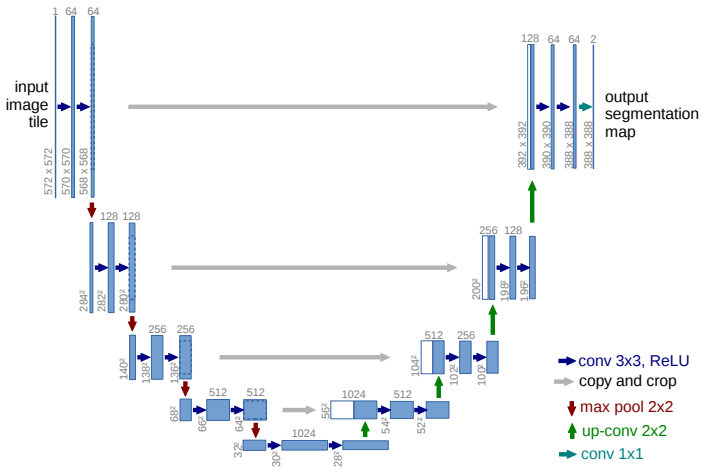

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

In [54]:
import torch.nn.functional as F
import torch.nn as nn

In [61]:
import torch
import torch.nn as nn

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, features=[64, 128, 256, 512]):
        """
        :param in_channels: Количество каналов на входе (например, 3 для RGB изображений).
        :param out_channels: Количество каналов на выходе (например, 1 для бинарной сегментации).
        :param features: Список с количеством фильтров на каждом уровне U-Net.
        """
        super(UNet, self).__init__()
        self.encoder = nn.ModuleList()
        self.decoder = nn.ModuleList()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Блоки энкодера
        for feature in features:
            self.encoder.append(self.double_conv(in_channels, feature))
            in_channels = feature

        # Блокы декодера
        for feature in reversed(features):
            self.decoder.append(nn.ConvTranspose2d(feature * 2, feature, kernel_size=2, stride=2))
            self.decoder.append(self.double_conv(feature * 2, feature))

        # Последний сверточный слой
        self.bottleneck = self.double_conv(features[-1], features[-1] * 2)
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x):
        skip_connections = []

        # Энкодер
        for layer in self.encoder:
            x = layer(x)
            skip_connections.append(x)
            x = self.pool(x)

        # Боттлнек
        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]  # Инвертируем порядок для декодера

        # Декодер
        for idx in range(0, len(self.decoder), 2):
            x = self.decoder[idx](x)  # Transposed Convolution
            skip_connection = skip_connections[idx // 2]

            # Если размеры не совпадают из-за особенностей сверток, подгоняем их
            if x.shape != skip_connection.shape:
                x = self._crop(skip_connection, x)

            # Слияние skip connection
            x = torch.cat((skip_connection, x), dim=1)
            x = self.decoder[idx + 1](x)  # Double Conv

        # Последний слой
        return self.final_conv(x)

    def double_conv(self, in_channels, out_channels):
        """
        Последовательность из двух сверток + BatchNorm + ReLU.
        """
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def _crop(self, skip, x):
        """
        Обрезка skip connection, чтобы размеры совпадали (для слияния с выходом transposed conv).
        """
        _, _, h, w = x.shape
        skip = nn.functional.center_crop(skip, [h, w])
        return skip


In [62]:
unet_model = UNet().to(device)

In [63]:
loss_functions = {
    'BCE': bce_torch_with_logits,
    'FocalLoss': lambda Y_pred, Y_batch: sigmoid_focal_loss(Y_pred, Y_batch, alpha=0.25, gamma=2, reduction='mean'),
    'Tversky': tverskyloss,
    'DiceLoss': dice_loss
}
list_plot_unet = list()
for loss_name, loss_fn in loss_functions.items():
    print('------------------------------------------------')
    print(f'ОБУЧЕНИЕ c {loss_name}')


    model = UNet().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    epochs = 35
    criterion = bce_torch_with_logits
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        patience=3,
        threshold=1e-4,
        mode="min"
    )
    res = train(model, optimizer, loss_fn, epochs, train_dataloader, valid_dataloader, scheduler, iou_score)
    list_plot_unet.append(res)

------------------------------------------------
ОБУЧЕНИЕ c BCE


  0%|          | 0/35 [00:00<?, ?it/s]


 Epoch 1 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 1 loss - 1040722.484375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1125030.6250, Metric(IoU): 0.0000

 Epoch 2 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 2 loss - 834874.03125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1112523.3750, Metric(IoU): 0.0000

 Epoch 3 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 3 loss - 732393.8125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1083042.1250, Metric(IoU): 0.0000

 Epoch 4 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 4 loss - 650501.625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1021250.1875, Metric(IoU): 0.0000

 Epoch 5 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 5 loss - 598074.796875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 940219.8438, Metric(IoU): 0.0000

 Epoch 6 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 6 loss - 545805.0234375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 933876.6875, Metric(IoU): 0.0000

 Epoch 7 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 7 loss - 532035.4921875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 996323.8438, Metric(IoU): 0.0019

 Epoch 8 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 8 loss - 523875.25


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 949484.2188, Metric(IoU): 0.0639

 Epoch 9 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 9 loss - 492719.7109375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 844224.5312, Metric(IoU): 0.2088

 Epoch 10 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 10 loss - 486370.4296875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 589848.0000, Metric(IoU): 0.5988

 Epoch 11 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 11 loss - 461855.453125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 567938.5625, Metric(IoU): 0.7175

 Epoch 12 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 12 loss - 461296.40625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 500095.4531, Metric(IoU): 0.7241

 Epoch 13 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 13 loss - 455519.6953125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 469293.2188, Metric(IoU): 0.7853

 Epoch 14 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 14 loss - 467280.359375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 452639.3281, Metric(IoU): 0.8214

 Epoch 15 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 15 loss - 451172.265625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 469750.3125, Metric(IoU): 0.8002

 Epoch 16 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 16 loss - 437789.8984375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 430790.5312, Metric(IoU): 0.8354

 Epoch 17 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 17 loss - 441240.4765625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 412619.0000, Metric(IoU): 0.8394

 Epoch 18 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 18 loss - 402131.21875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 421421.0312, Metric(IoU): 0.8321

 Epoch 19 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 19 loss - 403373.96875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 438265.5938, Metric(IoU): 0.8308

 Epoch 20 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 20 loss - 395470.2421875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 451211.1562, Metric(IoU): 0.8415

 Epoch 21 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 21 loss - 390770.9453125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 461547.8750, Metric(IoU): 0.8480

 Epoch 22 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 22 loss - 375894.4296875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 447786.7188, Metric(IoU): 0.8497

 Epoch 23 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 23 loss - 369107.8203125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 440079.1562, Metric(IoU): 0.8479

 Epoch 24 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 24 loss - 385410.203125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 437056.5312, Metric(IoU): 0.8448

 Epoch 25 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 25 loss - 372002.6015625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 436718.3125, Metric(IoU): 0.8429

 Epoch 26 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 26 loss - 362779.3828125


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 437847.9375, Metric(IoU): 0.8431

 Epoch 27 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 27 loss - 386995.1875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 439329.2656, Metric(IoU): 0.8428

 Epoch 28 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 28 loss - 385167.8671875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 437579.3281, Metric(IoU): 0.8432

 Epoch 29 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 29 loss - 375600.15625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 438658.5469, Metric(IoU): 0.8433

 Epoch 30 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 30 loss - 360423.96875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 438656.1719, Metric(IoU): 0.8434

 Epoch 31 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 31 loss - 366517.6875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 438253.8906, Metric(IoU): 0.8436

 Epoch 32 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 32 loss - 383520.4375


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 435863.8750, Metric(IoU): 0.8439

 Epoch 33 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 33 loss - 365333.65625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 437142.7812, Metric(IoU): 0.8436

 Epoch 34 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 34 loss - 362545.171875


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 439153.1406, Metric(IoU): 0.8433

 Epoch 35 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 35 loss - 370903.2890625


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 438358.3594, Metric(IoU): 0.8434

Final IoU: 0.8434
------------------------------------------------
ОБУЧЕНИЕ c FocalLoss


  0%|          | 0/35 [00:00<?, ?it/s]


 Epoch 1 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 1 loss - 0.11971857585012913


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0885, Metric(IoU): 0.0000

 Epoch 2 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 2 loss - 0.07541492581367493


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0865, Metric(IoU): 0.0000

 Epoch 3 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 3 loss - 0.05568024981766939


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0813, Metric(IoU): 0.0000

 Epoch 4 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 4 loss - 0.03933741804212332


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0732, Metric(IoU): 0.0000

 Epoch 5 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 5 loss - 0.03422370133921504


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0641, Metric(IoU): 0.0000

 Epoch 6 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 6 loss - 0.027536363806575537


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0583, Metric(IoU): 0.0000

 Epoch 7 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 7 loss - 0.02816026285290718


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0645, Metric(IoU): 0.0046

 Epoch 8 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 8 loss - 0.023582851979881525


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0881, Metric(IoU): 0.0405

 Epoch 9 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 9 loss - 0.024828295689076185


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0620, Metric(IoU): 0.1683

 Epoch 10 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 10 loss - 0.025991524569690228


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0505, Metric(IoU): 0.1971

 Epoch 11 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 11 loss - 0.0235576587729156


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0347, Metric(IoU): 0.3597

 Epoch 12 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 12 loss - 0.02219496387988329


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0318, Metric(IoU): 0.5065

 Epoch 13 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 13 loss - 0.021053702104836702


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0280, Metric(IoU): 0.5429

 Epoch 14 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 14 loss - 0.017952128313481808


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0224, Metric(IoU): 0.7039

 Epoch 15 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 15 loss - 0.0175179704092443


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0259, Metric(IoU): 0.7901

 Epoch 16 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 16 loss - 0.017522621899843216


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0262, Metric(IoU): 0.7829

 Epoch 17 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 17 loss - 0.015507370932027698


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0296, Metric(IoU): 0.8051

 Epoch 18 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 18 loss - 0.01714977389201522


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0301, Metric(IoU): 0.7803

 Epoch 19 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 19 loss - 0.0148040393833071


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0284, Metric(IoU): 0.7847

 Epoch 20 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 20 loss - 0.0159118021838367


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0275, Metric(IoU): 0.7983

 Epoch 21 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 21 loss - 0.01531083369627595


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0264, Metric(IoU): 0.8053

 Epoch 22 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 22 loss - 0.013929038541391492


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0250, Metric(IoU): 0.8063

 Epoch 23 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 23 loss - 0.015086505794897676


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0249, Metric(IoU): 0.8058

 Epoch 24 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 24 loss - 0.014446428045630455


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0250, Metric(IoU): 0.8058

 Epoch 25 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 25 loss - 0.013952198904007673


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0251, Metric(IoU): 0.8051

 Epoch 26 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 26 loss - 0.015947342151775956


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0252, Metric(IoU): 0.8048

 Epoch 27 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 27 loss - 0.014914532657712698


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0255, Metric(IoU): 0.8054

 Epoch 28 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 28 loss - 0.016241975827142596


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0257, Metric(IoU): 0.8066

 Epoch 29 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 29 loss - 0.014150611590594053


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0255, Metric(IoU): 0.8048

 Epoch 30 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 30 loss - 0.014427825342863798


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0252, Metric(IoU): 0.8044

 Epoch 31 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 31 loss - 0.015077017014846206


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0251, Metric(IoU): 0.8037

 Epoch 32 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 32 loss - 0.015573800774291158


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0251, Metric(IoU): 0.8034

 Epoch 33 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 33 loss - 0.015534805366769433


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0257, Metric(IoU): 0.8060

 Epoch 34 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 34 loss - 0.015565690584480762


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0260, Metric(IoU): 0.8070

 Epoch 35 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 35 loss - 0.015936887124553323


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0257, Metric(IoU): 0.8063

Final IoU: 0.8063
------------------------------------------------
ОБУЧЕНИЕ c Tversky


  0%|          | 0/35 [00:00<?, ?it/s]


 Epoch 1 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 1 loss - 0.8817934393882751


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.9868, Metric(IoU): 0.0000

 Epoch 2 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 2 loss - 0.6549050360918045


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1.0524, Metric(IoU): 0.0000

 Epoch 3 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 3 loss - 0.5278356969356537


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1.1010, Metric(IoU): 0.0000

 Epoch 4 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 4 loss - 0.4410996735095978


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 1.0754, Metric(IoU): 0.0000

 Epoch 5 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 5 loss - 0.37304526567459106


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.9414, Metric(IoU): 0.0023

 Epoch 6 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 6 loss - 0.32488207519054413


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.7462, Metric(IoU): 0.3386

 Epoch 7 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 7 loss - 0.2863557040691376


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.5578, Metric(IoU): 0.4949

 Epoch 8 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 8 loss - 0.26950134336948395


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4225, Metric(IoU): 0.5649

 Epoch 9 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 9 loss - 0.2422119677066803


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3590, Metric(IoU): 0.5944

 Epoch 10 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 10 loss - 0.23080329596996307


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2631, Metric(IoU): 0.6195

 Epoch 11 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 11 loss - 0.2152777761220932


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1974, Metric(IoU): 0.6484

 Epoch 12 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 12 loss - 0.20857733488082886


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2193, Metric(IoU): 0.7143

 Epoch 13 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 13 loss - 0.19097121059894562


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1961, Metric(IoU): 0.7480

 Epoch 14 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 14 loss - 0.1827153116464615


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2215, Metric(IoU): 0.7683

 Epoch 15 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 15 loss - 0.17309615015983582


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2529, Metric(IoU): 0.7730

 Epoch 16 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 16 loss - 0.17025212943553925


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1478, Metric(IoU): 0.7886

 Epoch 17 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 17 loss - 0.16744938492774963


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1391, Metric(IoU): 0.7952

 Epoch 18 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 18 loss - 0.15273095667362213


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1332, Metric(IoU): 0.7684

 Epoch 19 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 19 loss - 0.14504171907901764


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0725, Metric(IoU): 0.7877

 Epoch 20 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 20 loss - 0.1476811021566391


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0400, Metric(IoU): 0.7934

 Epoch 21 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 21 loss - 0.13660991191864014


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0321, Metric(IoU): 0.8145

 Epoch 22 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 22 loss - 0.1354929506778717


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0330, Metric(IoU): 0.8054

 Epoch 23 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 23 loss - 0.12521864473819733


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0615, Metric(IoU): 0.8128

 Epoch 24 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 24 loss - 0.11864317953586578


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1104, Metric(IoU): 0.8189

 Epoch 25 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 25 loss - 0.11898893117904663


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.1030, Metric(IoU): 0.8097

 Epoch 26 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 26 loss - 0.11775965988636017


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0998, Metric(IoU): 0.8124

 Epoch 27 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 27 loss - 0.11410751938819885


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0886, Metric(IoU): 0.8181

 Epoch 28 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 28 loss - 0.11494801938533783


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0859, Metric(IoU): 0.8219

 Epoch 29 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 29 loss - 0.11504712700843811


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0849, Metric(IoU): 0.8262

 Epoch 30 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 30 loss - 0.11080522835254669


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0878, Metric(IoU): 0.8281

 Epoch 31 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 31 loss - 0.11706627905368805


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0928, Metric(IoU): 0.8282

 Epoch 32 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 32 loss - 0.10892117023468018


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0910, Metric(IoU): 0.8290

 Epoch 33 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 33 loss - 0.10980391502380371


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0908, Metric(IoU): 0.8294

 Epoch 34 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 34 loss - 0.1150846928358078


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0977, Metric(IoU): 0.8298

 Epoch 35 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 35 loss - 0.1105475127696991


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.0931, Metric(IoU): 0.8298

Final IoU: 0.8298
------------------------------------------------
ОБУЧЕНИЕ c DiceLoss


  0%|          | 0/35 [00:00<?, ?it/s]


 Epoch 1 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 1 loss - 0.5385231971740723


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6110, Metric(IoU): 0.0000

 Epoch 2 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 2 loss - 0.4320716857910156


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6142, Metric(IoU): 0.0000

 Epoch 3 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 3 loss - 0.3782287687063217


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6189, Metric(IoU): 0.0000

 Epoch 4 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 4 loss - 0.33479298651218414


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6244, Metric(IoU): 0.0000

 Epoch 5 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 5 loss - 0.30633772909641266


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6264, Metric(IoU): 0.0000

 Epoch 6 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 6 loss - 0.2861163318157196


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6251, Metric(IoU): 0.0000

 Epoch 7 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 7 loss - 0.2845526784658432


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6278, Metric(IoU): 0.0019

 Epoch 8 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 8 loss - 0.27426160871982574


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.6040, Metric(IoU): 0.0504

 Epoch 9 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 9 loss - 0.2717253863811493


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4979, Metric(IoU): 0.3110

 Epoch 10 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 10 loss - 0.2905096262693405


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.4030, Metric(IoU): 0.5476

 Epoch 11 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 11 loss - 0.2714483141899109


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3442, Metric(IoU): 0.6828

 Epoch 12 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 12 loss - 0.2872883528470993


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.3131, Metric(IoU): 0.7470

 Epoch 13 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 13 loss - 0.26098988950252533


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2981, Metric(IoU): 0.7861

 Epoch 14 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 14 loss - 0.2671506106853485


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2758, Metric(IoU): 0.8117

 Epoch 15 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 15 loss - 0.2613397538661957


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2712, Metric(IoU): 0.8235

 Epoch 16 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 16 loss - 0.2602413594722748


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2696, Metric(IoU): 0.8276

 Epoch 17 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 17 loss - 0.25761935114860535


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2626, Metric(IoU): 0.8276

 Epoch 18 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 18 loss - 0.26398660242557526


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2609, Metric(IoU): 0.8277

 Epoch 19 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 19 loss - 0.2591596394777298


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2615, Metric(IoU): 0.8334

 Epoch 20 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 20 loss - 0.2476813644170761


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2581, Metric(IoU): 0.8341

 Epoch 21 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 21 loss - 0.24916528165340424


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2551, Metric(IoU): 0.8305

 Epoch 22 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 22 loss - 0.24431267380714417


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2556, Metric(IoU): 0.8305

 Epoch 23 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 23 loss - 0.24133725464344025


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2581, Metric(IoU): 0.8351

 Epoch 24 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 24 loss - 0.24646155536174774


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2601, Metric(IoU): 0.8327

 Epoch 25 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 25 loss - 0.24469299614429474


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2592, Metric(IoU): 0.8274

 Epoch 26 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 26 loss - 0.23754383623600006


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2603, Metric(IoU): 0.8276

 Epoch 27 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 27 loss - 0.23545078933238983


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2594, Metric(IoU): 0.8284

 Epoch 28 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 28 loss - 0.2386927753686905


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2571, Metric(IoU): 0.8300

 Epoch 29 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 29 loss - 0.24273531138896942


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2573, Metric(IoU): 0.8292

 Epoch 30 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 30 loss - 0.26079803705215454


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2573, Metric(IoU): 0.8317

 Epoch 31 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 31 loss - 0.2368084043264389


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2604, Metric(IoU): 0.8310

 Epoch 32 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 32 loss - 0.2373509556055069


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2571, Metric(IoU): 0.8317

 Epoch 33 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 33 loss - 0.23819318413734436


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2567, Metric(IoU): 0.8328

 Epoch 34 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 34 loss - 0.24057269096374512


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2568, Metric(IoU): 0.8327

 Epoch 35 / 35


Training:   0%|          | 0/4 [00:00<?, ?it/s]

In epoches 35 loss - 0.24892717599868774


Validation:   0%|          | 0/2 [00:00<?, ?it/s]

Loss valid: 0.2565, Metric(IoU): 0.8322

Final IoU: 0.8322


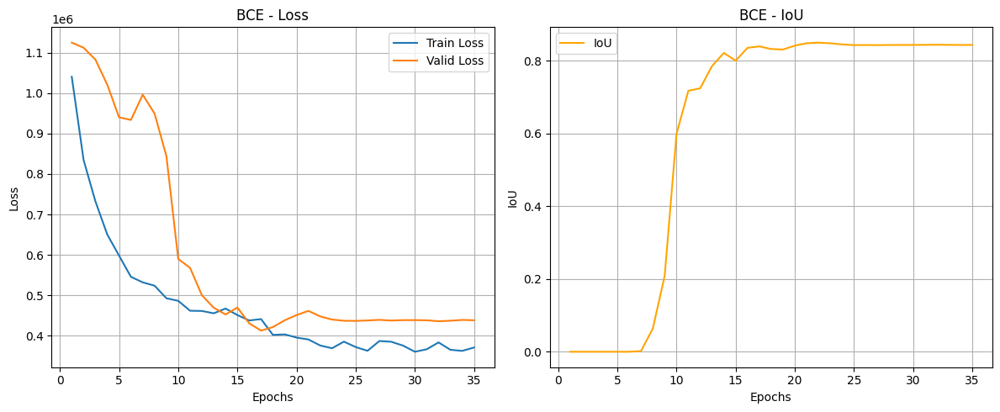

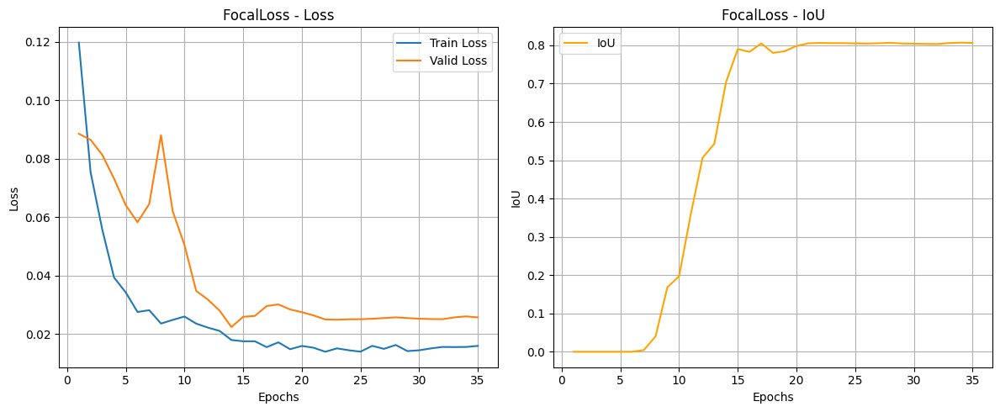

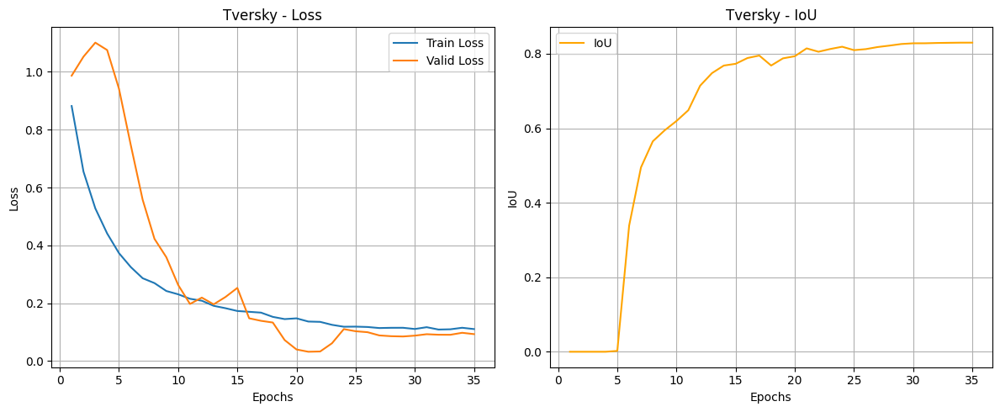

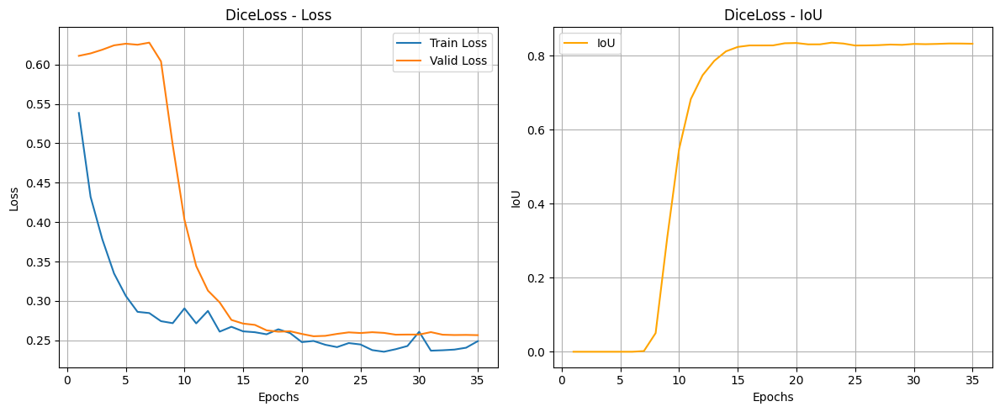

In [69]:
import matplotlib.pyplot as plt

# Создаем график для каждой функции потерь
for idx, res in enumerate(list_plot_unet):
    train_loss, valid_loss, metric_score = res

    # Определение названия функции потерь
    loss_name = list(loss_functions.keys())[idx]

    # Создаем фигуру
    plt.figure(figsize=(12, 5))

    # Подграфик 1: Loss
    plt.subplot(1, 2, 1)
    plt.plot(range(1, len(train_loss) + 1), train_loss, label="Train Loss")
    plt.plot(range(1, len(valid_loss) + 1), valid_loss, label="Valid Loss")
    plt.title(f"{loss_name} - Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid()

    # Подграфик 2: IoU
    plt.subplot(1, 2, 2)
    plt.plot(range(1, len(metric_score) + 1), metric_score, label="IoU", color='orange')
    plt.title(f"{loss_name} - IoU")
    plt.xlabel("Epochs")
    plt.ylabel("IoU")
    plt.legend()
    plt.grid()

    # Отображаем график
    plt.tight_layout()
    plt.show()


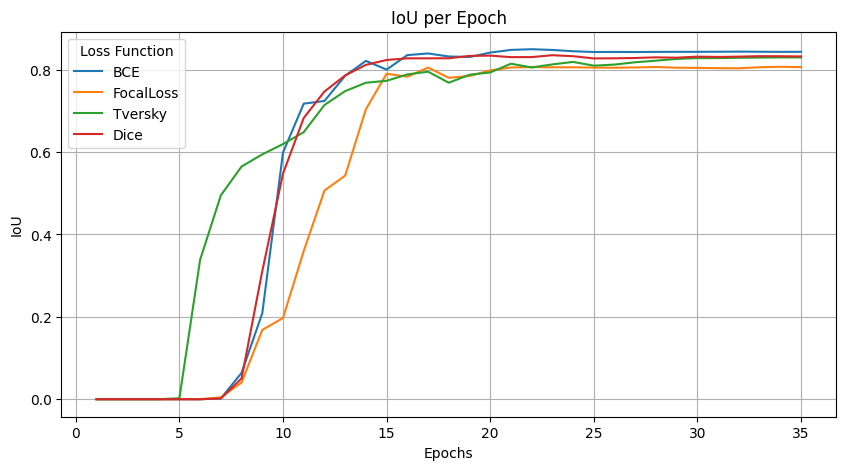

In [71]:
# Список с названиями метрик
loss_titles = ["BCЕ","FocalLoss", "Tversky", "Dice"]

plt.figure(figsize=(10, 5))
plt.xlabel('Epochs')
plt.ylabel('IoU')

# Проходим по результатам и добавляем в график
for result, res in enumerate(list_plot_unet):
    if result < len(loss_titles):  # Проверка на случай ошибки
        title = loss_titles[result]
        plt.plot(range(1, epochs + 1), res[2], label=title)  # Используем имя метрики

plt.title('IoU per Epoch')
plt.legend(title="Loss Function")  # Заголовок легенды
plt.grid(True)  # Добавим сетку для лучшей читаемости
plt.show()


Видно что модель Unet имеет большую точность благодрая skip connection-ам, поэтому все метрики достигают ioU к 0.8, но самая быстрая сходимость все же у DICE

In [ ]:
Видно что

## Обучите UNet

Задание: обучите UNet на всех трех лоссах: BCE, Dice, Focal и сравните результаты с SegNet:
*   Какая модель дает лучшие значения по метрике?
*   Какая модель дает лучшие значения по лоссам?
*   Какая модель обучается быстрее?
*   Сравните визуально результаты SegNet и UNet.

Напишите развернутый ответ на вопросы.



In [ ]:
1.Dice
2.tveksy loss
3.Dice

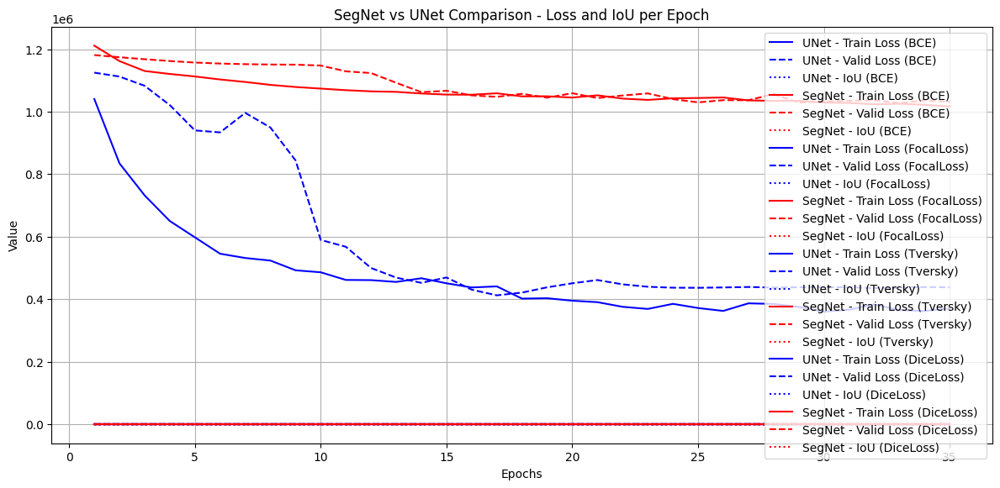

In [72]:
import matplotlib.pyplot as plt

# Создаем фигуру для всех графиков
plt.figure(figsize=(12, 6))

# Для каждого набора данных (UNet и SegNet) строим графики
for idx, (unet_res, segnet_res) in enumerate(zip(list_plot_unet, list_plot_seg)):

    # Результаты для UNet и SegNet
    unet_train_loss, unet_valid_loss, unet_iou = unet_res
    segnet_train_loss, segnet_valid_loss, segnet_iou = segnet_res

    # Получаем имена loss функций
    loss_name_unet = list(loss_functions.keys())[idx]
    loss_name_segnet = list(loss_functions.keys())[idx]

    # Добавляем линии для потерь и IoU для UNet
    plt.plot(range(1, len(unet_train_loss) + 1), unet_train_loss, label=f"UNet - Train Loss ({loss_name_unet})", linestyle='-', color='blue')
    plt.plot(range(1, len(unet_valid_loss) + 1), unet_valid_loss, label=f"UNet - Valid Loss ({loss_name_unet})", linestyle='--', color='blue')
    plt.plot(range(1, len(unet_iou) + 1), unet_iou, label=f"UNet - IoU ({loss_name_unet})", linestyle=':', color='blue')

    # Добавляем линии для потерь и IoU для SegNet
    plt.plot(range(1, len(segnet_train_loss) + 1), segnet_train_loss, label=f"SegNet - Train Loss ({loss_name_segnet})", linestyle='-', color='red')
    plt.plot(range(1, len(segnet_valid_loss) + 1), segnet_valid_loss, label=f"SegNet - Valid Loss ({loss_name_segnet})", linestyle='--', color='red')
    plt.plot(range(1, len(segnet_iou) + 1), segnet_iou, label=f"SegNet - IoU ({loss_name_segnet})", linestyle=':', color='red')

# Настройка графика
plt.title("SegNet vs UNet Comparison - Loss and IoU per Epoch")
plt.xlabel("Epochs")
plt.ylabel("Value")
plt.legend()
plt.grid(True)

# Отображаем итоговый график
plt.tight_layout()
plt.show()


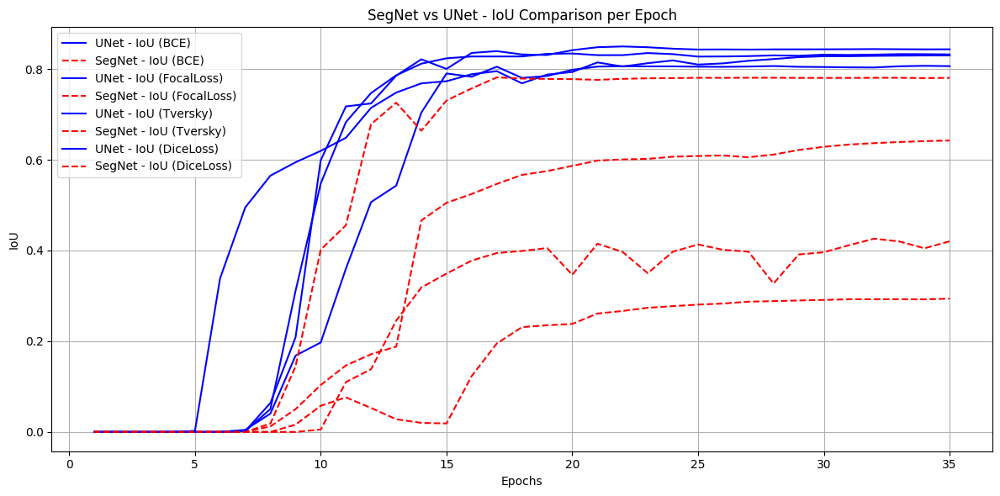

In [73]:
import matplotlib.pyplot as plt

# Создаем фигуру для графика IoU
plt.figure(figsize=(12, 6))

# Для каждого набора данных (UNet и SegNet) строим графики
for idx, (unet_res, segnet_res) in enumerate(zip(list_plot_unet, list_plot_seg)):

    # Результаты для UNet и SegNet
    unet_train_loss, unet_valid_loss, unet_iou = unet_res
    segnet_train_loss, segnet_valid_loss, segnet_iou = segnet_res

    # Получаем имена loss функций
    loss_name_unet = list(loss_functions.keys())[idx]
    loss_name_segnet = list(loss_functions.keys())[idx]

    # Добавляем линии для IoU для UNet
    plt.plot(range(1, len(unet_iou) + 1), unet_iou, label=f"UNet - IoU ({loss_name_unet})", linestyle='-', color='blue')

    # Добавляем линии для IoU для SegNet
    plt.plot(range(1, len(segnet_iou) + 1), segnet_iou, label=f"SegNet - IoU ({loss_name_segnet})", linestyle='--', color='red')

# Настройка графика
plt.title("SegNet vs UNet - IoU Comparison per Epoch")
plt.xlabel("Epochs")
plt.ylabel("IoU")
plt.legend()
plt.grid(True)

# Отображаем итоговый график
plt.tight_layout()
plt.show()


Первый график не особо инфрмативный поскольку потери для segnet на BCЕ очень большие!, однако сравнивая iOU видно что модель Unet учится гораздо точнее и быстрее
